Analista: Iury Montenegro Farias

# 1. Entendimento do Negócio
## Objetivo
Nosso objetivo é desenvolver um modelo preditivo que possa prever o preço futuro das ações com alta precisão, auxiliando os investidores a tomar decisões mais informadas.

## Problema de Negócio
Os preços das ações são altamente voláteis e influenciados por uma variedade de fatores econômicos e de mercado. Prever esses preços com precisão pode resultar em retornos financeiros significativos.

## Benefícios
Um modelo preditivo bem-sucedido ajudará a maximizar o retorno sobre o investimento e minimizar os riscos associados ao trading de ações.


# 2. Entendimento dos Dados:

In [1]:
# Importando Bibliotecas
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

acao = yf.Ticker('ITUB4.SA')
historico = acao.history(period="5y")

historico.reset_index(inplace=True)
historico['Date'] = pd.to_datetime(historico['Date'])

# Carregando os dados
df = pd.DataFrame(historico)

# Visão Geral dos Dados
df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2019-08-19 00:00:00-03:00,28.348307,28.528294,27.742887,27.980146,22628600,0.0,0.0
1,2019-08-20 00:00:00-03:00,28.119223,28.184675,27.448354,27.669250,17302100,0.0,0.0
2,2019-08-21 00:00:00-03:00,27.971958,28.094679,27.620160,27.881966,19548800,0.0,0.0
3,2019-08-22 00:00:00-03:00,27.939238,28.086502,27.407450,27.440176,13552000,0.0,0.0
4,2019-08-23 00:00:00-03:00,27.071999,27.734687,26.941098,27.121088,26285900,0.0,0.0


Date: Esta coluna representa a data em que os preços foram registrados. É essencial para ordenar e analisar a evolução temporal dos preços da ação.

Open: O preço de abertura é o valor pelo qual a ação começou a ser negociada no início do dia. É importante para comparar com o fechamento anterior e observar tendências de curto prazo.

High: O preço máximo alcançado pela ação durante o dia de negociação. Essa informação ajuda a entender até onde os compradores estavam dispostos a pagar no dia.

Low: O preço mínimo ao qual a ação foi negociada durante o dia. Ele mostra o ponto mais baixo de venda e pode indicar pressões de venda.

Close: O preço de fechamento é o valor final pelo qual a ação foi negociada no fim do dia. Este é um dos valores mais importantes para análises, pois reflete a última percepção do mercado sobre o valor da ação no dia.

Volume: Refere-se ao número de ações negociadas durante o dia. Um volume alto pode indicar forte interesse na ação, enquanto um volume baixo pode sugerir menos interesse.

Dividends: Esta coluna mostra o valor dos dividendos pagos pela ação em uma data específica. Dividendos são importantes para investidores focados em renda, pois representam retornos diretos do investimento.

Stock Splits: Indica o número de subdivisões da ação. Um split não altera o valor total do investimento, mas aumenta o número de ações em circulação, o que pode tornar a ação mais acessível a um maior número de investidores.

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype                            
---  ------        --------------  -----                            
 0   Date          1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open          1245 non-null   float64                          
 2   High          1245 non-null   float64                          
 3   Low           1245 non-null   float64                          
 4   Close         1245 non-null   float64                          
 5   Volume        1245 non-null   int64                            
 6   Dividends     1245 non-null   float64                          
 7   Stock Splits  1245 non-null   float64                          
dtypes: datetime64[ns, America/Sao_Paulo](1), float64(6), int64(1)
memory usage: 77.9 KB


In [3]:
# Estatísticas Descritivas
df.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,1245.000000,1245.000000,1245.000000,1245.000000,1.245000e+03,1245.000000,1245.0
mean,25.098238,25.416414,24.777922,25.086993,3.321457e+07,0.004673,0.0
std,4.126348,4.109327,4.148638,4.139807,1.573272e+07,0.043326,0.0
min,17.781700,17.911748,16.666776,17.100113,8.159900e+06,0.000000,0.0
25%,22.047951,22.352253,21.712469,21.992792,2.251200e+07,0.000000,0.0
50%,24.449856,24.837778,24.173347,24.458714,3.015470e+07,0.000000,0.0
75%,27.564447,27.897999,27.256565,27.540297,4.065350e+07,0.000000,0.0
max,37.240002,37.490002,36.779999,37.049999,1.606699e+08,1.125125,0.0


### 1. Linha do Tempo de Preços (Time Series Plot)
Objetivo: Visualizar a evolução dos preços de abertura, fechamento, máxima e mínima ao longo do tempo.

Descrição: Um gráfico de linha onde o eixo X representa o tempo (Date) e o eixo Y representa os preços. É útil para identificar tendências de longo prazo, ciclos sazonais e volatilidade.

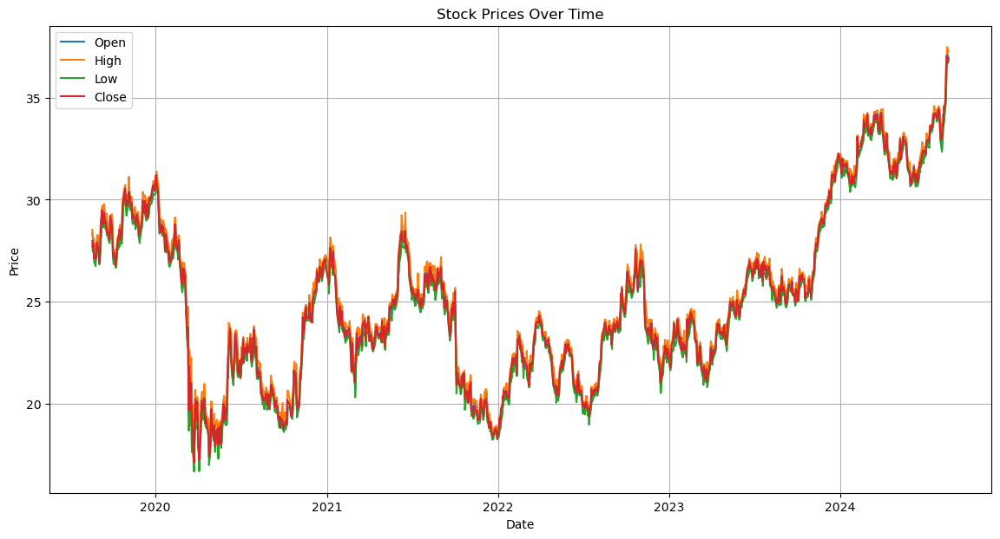

In [4]:
import matplotlib.pyplot as plt

# Supondo que 'df' seja o DataFrame contendo os dados históricos das ações
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Open'], label='Open')
plt.plot(df['Date'], df['High'], label='High')
plt.plot(df['Date'], df['Low'], label='Low')
plt.plot(df['Date'], df['Close'], label='Close')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Stock Prices Over Time')
plt.legend()
plt.grid(True)
plt.show()

### 2. Volume de Negociação (Bar Plot)

Objetivo: Visualizar o volume de negociação ao longo do tempo.

Descrição: Um gráfico de barras pode mostrar o volume de negociações diário. Ele ajuda a entender o interesse do mercado em determinados períodos, como durante altos ou baixos pronunciados nos preços.

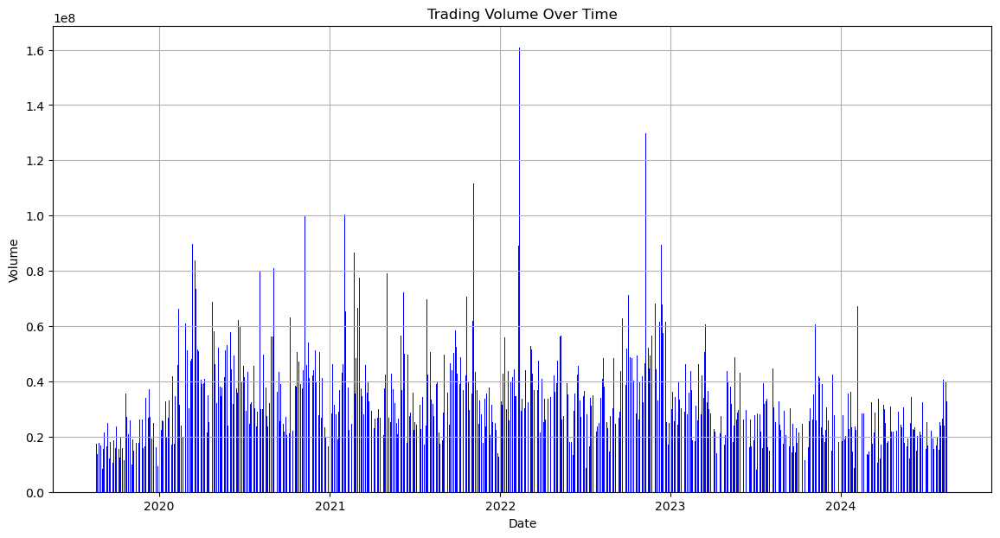

In [5]:
plt.figure(figsize=(14, 7))
plt.bar(df['Date'], df['Volume'], color='blue')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Trading Volume Over Time')
plt.grid(True)
plt.show()

### 3. Boxplot de Preços Diários

Objetivo: Comparar a distribuição dos preços de abertura, fechamento, alta e baixa.

Descrição: Um boxplot pode ser usado para cada uma dessas colunas, destacando a mediana, quartis e possíveis outliers. É útil para entender a variação dos preços e a presença de outliers.

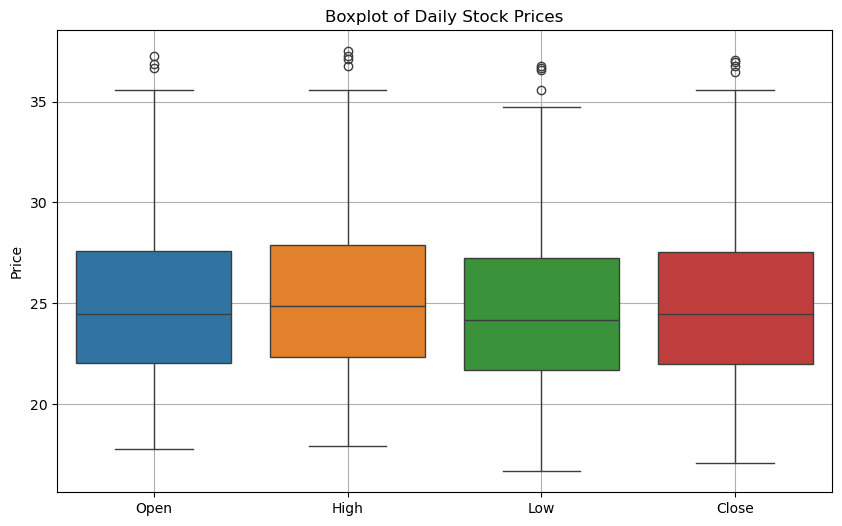

In [6]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(data=df[['Open', 'High', 'Low', 'Close']])
plt.title('Boxplot of Daily Stock Prices')
plt.ylabel('Price')
plt.grid(True)
plt.show()

### 4. Gráfico de Velas (Candlestick Chart)

Objetivo: Visualizar a variação diária dos preços de uma ação, incluindo abertura, fechamento, alta e baixa.

Descrição: Cada "vela" representa um dia de negociação, com a parte superior e inferior do corpo da vela mostrando os preços de abertura e fechamento, e as sombras (linhas finas) representando os preços alto e baixo. Este gráfico é amplamente utilizado em análises técnicas.

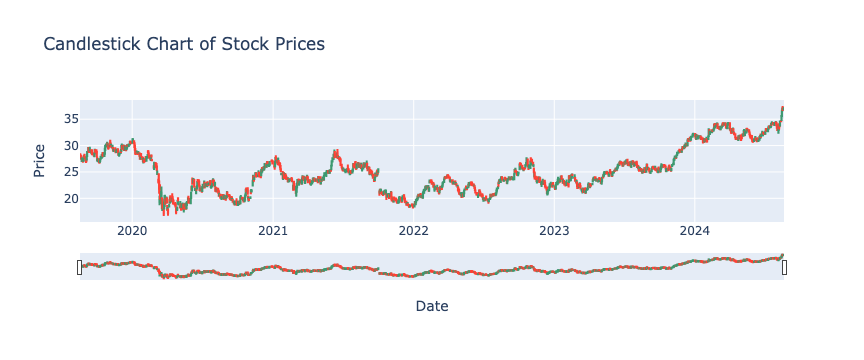

In [7]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                                     open=df['Open'],
                                     high=df['High'],
                                     low=df['Low'],
                                     close=df['Close'])])
fig.update_layout(title='Candlestick Chart of Stock Prices',
                  xaxis_title='Date',
                  yaxis_title='Price')
fig.show()

### 5. Correlação entre Variáveis (Heatmap)

Objetivo: Identificar relações entre diferentes variáveis, como preços e volumes.

Descrição: Um mapa de calor (heatmap) pode ser usado para visualizar a correlação entre diferentes colunas (Open, High, Low, Close, Volume). É útil para ver se há colunas que estão fortemente correlacionadas, o que pode influenciar a modelagem futura.

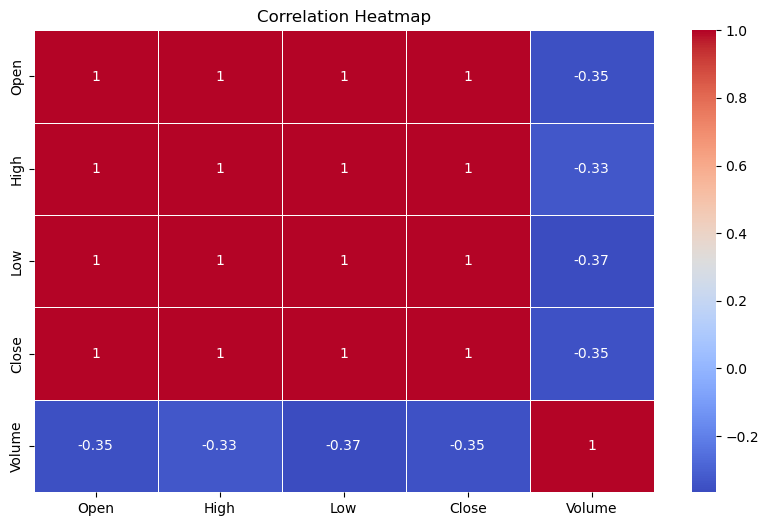

In [8]:
plt.figure(figsize=(10, 6))
corr = df[['Open', 'High', 'Low', 'Close', 'Volume']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

### 6. Histograma de Retornos Diários

Objetivo: Analisar a distribuição dos retornos diários.

Descrição: Um histograma mostrando os retornos diários calculados com base nos preços de fechamento. Ajuda a entender a volatilidade e a tendência de retornos negativos ou positivos.

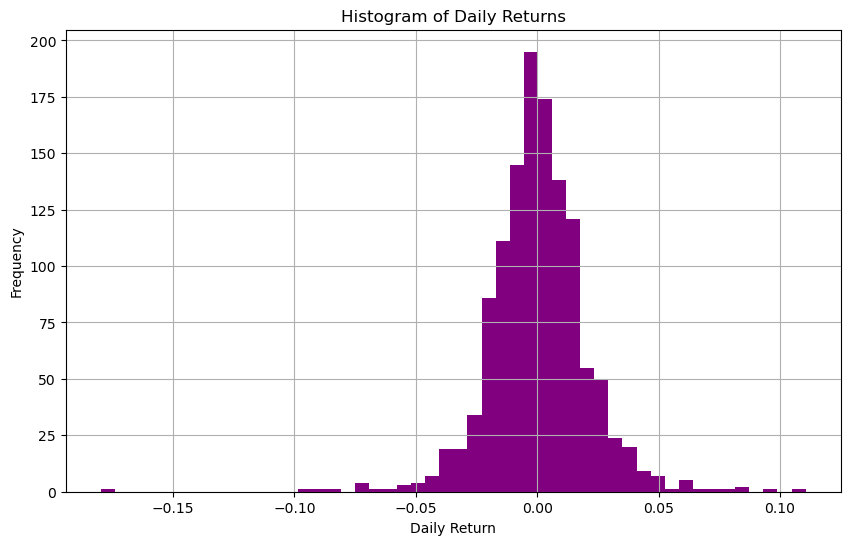

In [9]:
df['daily_return'] = df['Close'].pct_change()

plt.figure(figsize=(10, 6))
plt.hist(df['daily_return'].dropna(), bins=50, color='purple')
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.title('Histogram of Daily Returns')
plt.grid(True)
plt.show()

# 3. Preparação dos Dados

### Diferença entre Fechamento e Abertura (close_open_diff)

Descrição: A diferença entre o preço de fechamento e o preço de abertura de um dia.

Importância: Isso pode indicar o movimento intradiário do preço da ação. Uma diferença positiva pode sugerir uma tendência de alta durante o dia, enquanto uma diferença negativa pode indicar uma tendência de baixa.

In [10]:
df['close_open_diff'] = df['Close'] - df['Open']

### Amplitude do Dia (high_low_diff)

Descrição: A diferença entre o preço máximo e mínimo do dia.

Importância: A amplitude (volatilidade) do dia pode ser um indicador da incerteza ou volatilidade do mercado, que é um fator importante para prever movimentos futuros.

In [11]:
df['high_low_diff'] = df['High'] - df['Low']

### Média Móvel Simples de 7 dias (SMA_7)

Descrição: A média móvel simples dos últimos 7 dias de preços de fechamento.

Importância: As médias móveis ajudam a suavizar o preço ao longo do tempo, permitindo identificar tendências subjacentes. A média móvel de 7 dias captura tendências de curto prazo.

In [12]:
df['SMA_7'] = df['Close'].rolling(window=7).mean()

### Média Móvel Simples de 21 dias (SMA_21)

Descrição: A média móvel simples dos últimos 21 dias de preços de fechamento.
    
Importância: Captura tendências de médio prazo. Comparar SMA de curto e médio prazo pode ajudar a identificar cruzamentos de médias móveis, um sinal comum usado em estratégias de trading.

In [13]:
df['SMA_21'] = df['Close'].rolling(window=21).mean()

### Desvio Padrão de 7 dias (STD_7)

Descrição: O desvio padrão dos últimos 7 dias de preços de fechamento.

Importância: O desvio padrão mede a volatilidade do preço. Um alto desvio padrão indica alta volatilidade, enquanto um baixo desvio padrão sugere estabilidade no preço.

In [14]:
df['STD_7'] = df['Close'].rolling(window=7).std()

### Retorno Diário (daily_return)

Descrição: A variação percentual do preço de fechamento entre dias consecutivos.

Importância: O retorno diário é um indicador básico de performance da ação, utilizado amplamente em modelos de previsão financeira.

In [15]:
df['daily_return'] = df['Close'].pct_change()

### Indicador de Tendência (trend_indicator)

Descrição: Uma coluna binária que indica se o fechamento foi maior que a abertura (1) ou menor (0).

Importância: Esse indicador simples pode ajudar o modelo a identificar padrões de tendência.

In [16]:
df['trend_indicator'] = (df['Close'] > df['Open']).astype(int)

### Preço Médio do Dia (daily_avg_price)

Descrição: A média entre o preço de abertura, fechamento, máximo e mínimo do dia.

Importância: Representa uma média ponderada do preço, oferecendo uma visão mais completa do comportamento do preço durante o dia.

In [17]:
df['daily_avg_price'] = (df['Open'] + df['Close'] + df['High'] + df['Low']) / 4

### Retorno Acumulado (cumulative_return)

Descrição: O retorno acumulado ao longo do tempo, calculado como o produto dos retornos diários.

Importância: Esse campo mostra o crescimento percentual do investimento ao longo do período, útil para análise de longo prazo.

In [18]:
df['cumulative_return'] = (1 + df['daily_return']).cumprod() - 1

### Volume Médio de 7 dias (volume_avg_7)

Descrição: A média do volume de negociação dos últimos 7 dias.

Importância: Volume é um indicador chave para analisar a força de um movimento de preço. Um movimento de preço acompanhado por alto volume é considerado mais forte.

In [19]:
df['volume_avg_7'] = df['Volume'].rolling(window=7).mean()

### Média Móvel Curta (short_moving_average)

Descrição: A média móvel curta é a média dos preços de fechamento ao longo de um curto período (e.g., 5 dias).

Importância: As médias móveis curtas são cruciais para detectar mudanças rápidas no mercado, ajudando os modelos a capturar reversões de tendência ou confirmações de direção em períodos mais curtos.

In [20]:
df['short_moving_average'] = df['Close'].rolling(window=5).mean()

### Média Móvel Longa (long_moving_average)

Descrição: A média móvel longa é a média dos preços de fechamento ao longo de um período mais longo (e.g., 20 dias).

Importância: As médias móveis longas ajudam a suavizar as flutuações de curto prazo, permitindo que os modelos se concentrem em tendências subjacentes mais estáveis e de longo prazo.



In [21]:
df['long_moving_average'] = df['Close'].rolling(window=20).mean()

### Volatilidade (volatility)

Descrição: A volatilidade mede a dispersão dos retornos diários, calculada como o desvio padrão dos retornos diários ao longo de um período específico.

Importância: A volatilidade é um indicador-chave de risco, essencial para modelos que precisam avaliar a incerteza ou a probabilidade de grandes movimentos de preço, tanto para cima quanto para baixo.

In [22]:
df['volatility'] = df['daily_return'].rolling(window=20).std()

### Média Móvel Exponencial 12 Dias (ema_12)

Descrição: A Média Móvel Exponencial (EMA) é similar à média móvel simples, mas dá mais peso aos preços mais recentes.

Importância: A EMA permite que os modelos respondam mais rapidamente às mudanças nos preços, sendo crucial para prever movimentos de curto prazo com maior precisão.

In [23]:
df['ema_12'] = df['Close'].ewm(span=12, adjust=False).mean()

### Média Móvel Exponencial 26 Dias (ema_26)

Descrição: A Média Móvel Exponencial (EMA) de 26 dias é utilizada para identificar tendências mais de longo prazo em comparação com a EMA de 12 dias.

Importância: A EMA de 26 dias ajuda os modelos a capturar as tendências de médio a longo prazo, mantendo uma sensibilidade às mudanças recentes, mas sem ser influenciada por ruídos de curto prazo.

In [24]:
df['ema_26'] = df['Close'].ewm(span=26, adjust=False).mean()

### Convergência/Divergência de Médias Móveis (macd)

Descrição: A Convergência/Divergência de Médias Móveis (MACD) é calculada subtraindo a EMA de 26 dias da EMA de 12 dias.

Importância: O MACD é um indicador amplamente utilizado para detectar mudanças no momento e na direção da tendência, sendo valioso para modelos que precisam prever quando uma tendência pode estar se revertendo.

In [25]:
df['macd'] = df['ema_12'] - df['ema_26']

### Linha de Sinal (signal_line)

Descrição: A linha de sinal é a EMA de 9 dias da linha MACD.

Importância: A linha de sinal refina as previsões baseadas no MACD, fornecendo pontos claros de entrada e saída que podem melhorar a precisão dos modelos ao tomar decisões de negociação.

In [26]:
df['signal_line'] = df['macd'].ewm(span=9, adjust=False).mean()

### Índice de Força Relativa (rsi)

Descrição: O Índice de Força Relativa (RSI) mede a magnitude dos ganhos recentes em comparação com as perdas recentes para avaliar condições de sobrecompra ou sobrevenda.

Importância: O RSI é essencial para detectar condições extremas de mercado, ajudando os modelos a identificar quando uma ação pode estar prestes a reverter sua direção devido a condições de sobrecompra ou sobrevenda.

In [27]:
delta = df['Close'].diff()
gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
rs = gain / loss
df['rsi'] = 100 - (100 / (1 + rs))

### Banda de Bollinger Superior (bollinger_band_upper)

Descrição: A Banda de Bollinger superior é calculada como a média móvel simples de 20 dias mais duas vezes o desvio padrão dos preços de fechamento.

Importância: As bandas de Bollinger ajudam a identificar níveis de preço onde a ação pode encontrar resistência, auxiliando os modelos a prever reversões ou pausas em uma tendência de alta.

In [28]:
df['bollinger_band_upper'] = df['Close'].rolling(window=20).mean() + 2 * df['Close'].rolling(window=20).std()

### Banda de Bollinger Inferior (bollinger_band_lower)

Descrição: A Banda de Bollinger inferior é calculada como a média móvel simples de 20 dias menos duas vezes o desvio padrão dos preços de fechamento.

Importância: As bandas de Bollinger também ajudam a identificar níveis de suporte, onde os preços podem encontrar um piso, sendo útil para prever recuperações em mercados em baixa.

In [29]:
df['bollinger_band_lower'] = df['Close'].rolling(window=20).mean() - 2 * df['Close'].rolling(window=20).std()

### Faixa Média Verdadeira (average_true_range)

Descrição: A Faixa Média Verdadeira (ATR) mede a volatilidade ao calcular a média das faixas verdadeiras diárias em um período específico.

Importância: O ATR fornece uma medida da volatilidade diária, essencial para modelos que precisam ajustar as previsões com base nas condições de mercado em constante mudança.

In [30]:
high_low = df['High'] - df['Low']
high_close = (df['High'] - df['Close'].shift()).abs()
low_close = (df['Low'] - df['Close'].shift()).abs()
true_range = high_low.combine(high_close, max).combine(low_close, max)
df['average_true_range'] = true_range.rolling(window=14).mean()

### Convergência de Médias Móveis (moving_average_convergence)

Descrição: A Convergência de Médias Móveis (Moving Average Convergence) é um indicador técnico que reflete a diferença entre duas médias móveis de diferentes períodos.

Importância: Este indicador é valioso para detectar pontos de virada em uma tendência, ajudando os modelos a identificar quando uma nova tendência pode estar se formando.

In [31]:
df['moving_average_convergence'] = df['short_moving_average'] - df['long_moving_average']

### Momento (momentum)

Descrição: O Momento mede a taxa de mudança no preço do ativo.

Importância: O momentum é crucial para prever a continuidade ou reversão de uma tendência, fornecendo aos modelos uma medida da força por trás dos movimentos de preço.

In [32]:
df['momentum'] = df['Close'] - df['Close'].shift(14)

In [33]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,1245.0,2.509824e+01,4.126348e+00,1.778170e+01,2.204795e+01,2.444986e+01,2.756445e+01,3.724000e+01
High,1245.0,2.541641e+01,4.109327e+00,1.791175e+01,2.235225e+01,2.483778e+01,2.789800e+01,3.749000e+01
Low,1245.0,2.477792e+01,4.148638e+00,1.666678e+01,2.171247e+01,2.417335e+01,2.725657e+01,3.678000e+01
Close,1245.0,2.508699e+01,4.139807e+00,1.710011e+01,2.199279e+01,2.445871e+01,2.754030e+01,3.705000e+01
Volume,1245.0,3.321457e+07,1.573272e+07,8.159900e+06,2.251200e+07,3.015470e+07,4.065350e+07,1.606699e+08
Dividends,1245.0,4.673271e-03,4.332576e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.125125e+00
Stock Splits,1245.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
daily_return,1244.0,4.309919e-04,2.029353e-02,-1.796425e-01,-1.054960e-02,0.000000e+00,1.128779e-02,1.105933e-01
close_open_diff,1245.0,-1.124432e-02,3.850581e-01,-1.450009e+00,-2.627551e-01,-1.702329e-02,2.215093e-01,1.243515e+00
high_low_diff,1245.0,6.384915e-01,2.873198e-01,1.879982e-01,4.520974e-01,5.818578e-01,7.467955e-01,2.941687e+00


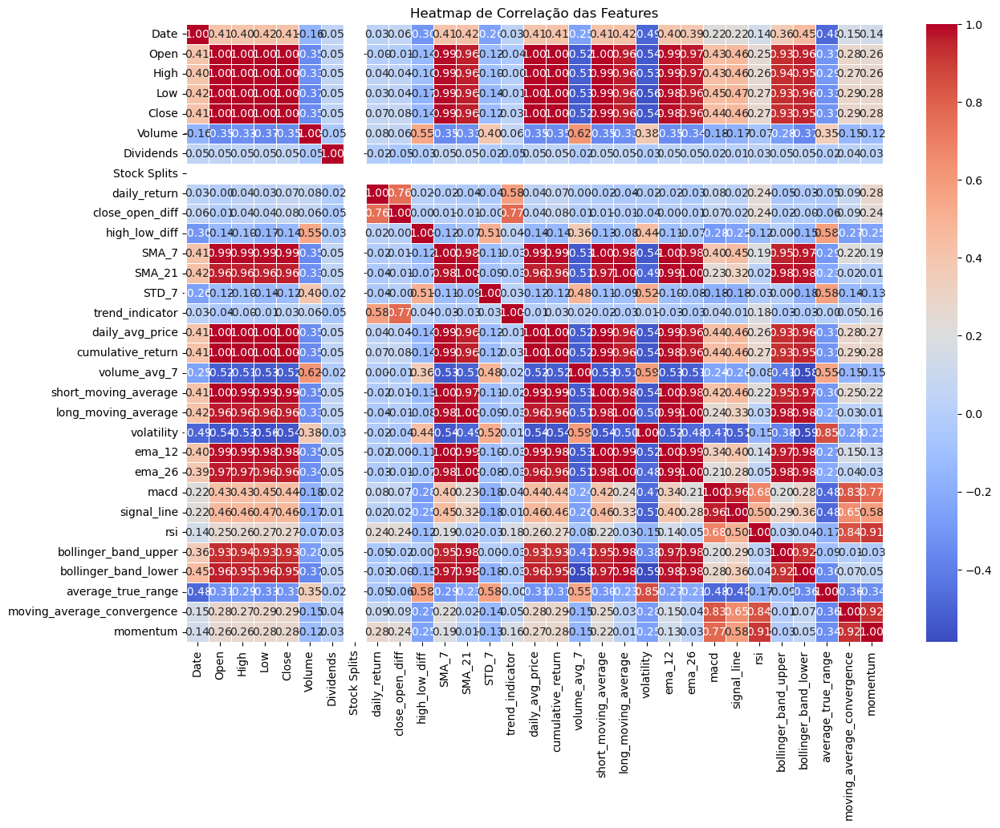

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcula a matriz de correlação
correlation_matrix = df.corr()

# Define o tamanho da figura
plt.figure(figsize=(14, 10))

# Cria o heatmap com anotações
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Adiciona o título ao gráfico
plt.title('Heatmap de Correlação das Features')
plt.show()

close_open_diff
Descrição: Diferença entre o preço de fechamento e o preço de abertura do mesmo dia.
Objetivo: Identificar a direção e a magnitude da mudança de preço ao longo do dia.


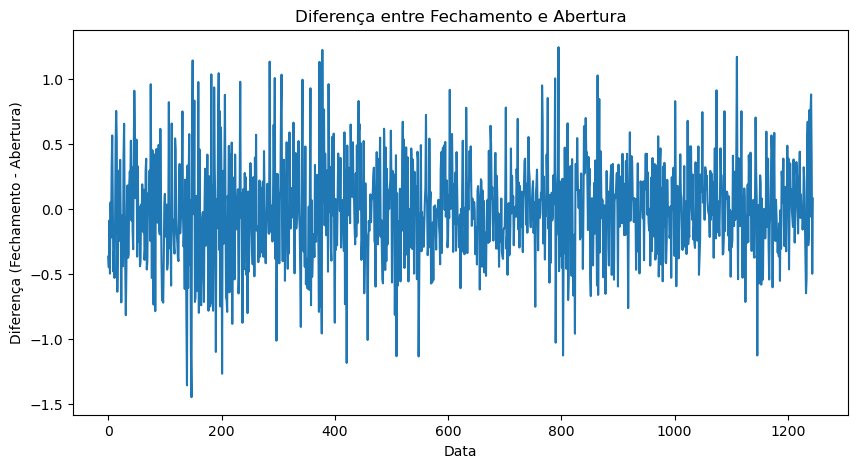

In [35]:
plt.figure(figsize=(10, 5))
df['close_open_diff'].plot()
plt.title('Diferença entre Fechamento e Abertura')
plt.xlabel('Data')
plt.ylabel('Diferença (Fechamento - Abertura)')
plt.show()

high_low_diff

Descrição: Diferença entre o preço mais alto e o preço mais baixo do dia.
    
Objetivo: Capturar a volatilidade intradiária.

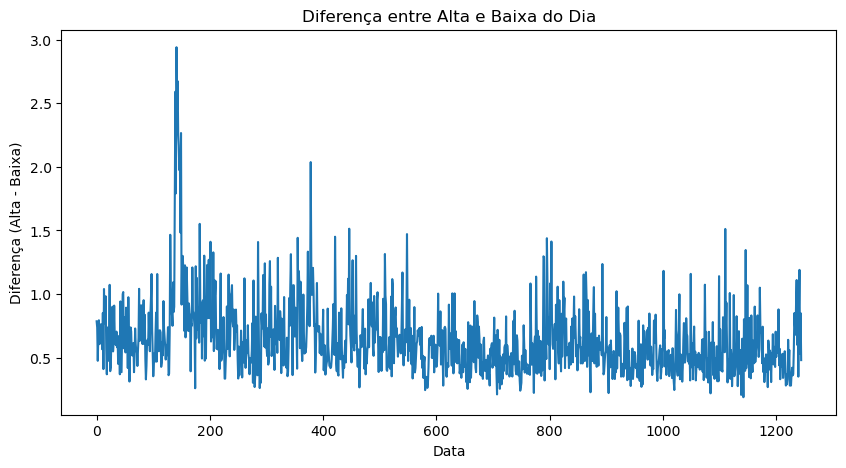

In [36]:
plt.figure(figsize=(10, 5))
df['high_low_diff'].plot()
plt.title('Diferença entre Alta e Baixa do Dia')
plt.xlabel('Data')
plt.ylabel('Diferença (Alta - Baixa)')
plt.show()

sma_7

Descrição: Média móvel simples de 7 dias.

Objetivo: Identificar tendências de curto prazo.

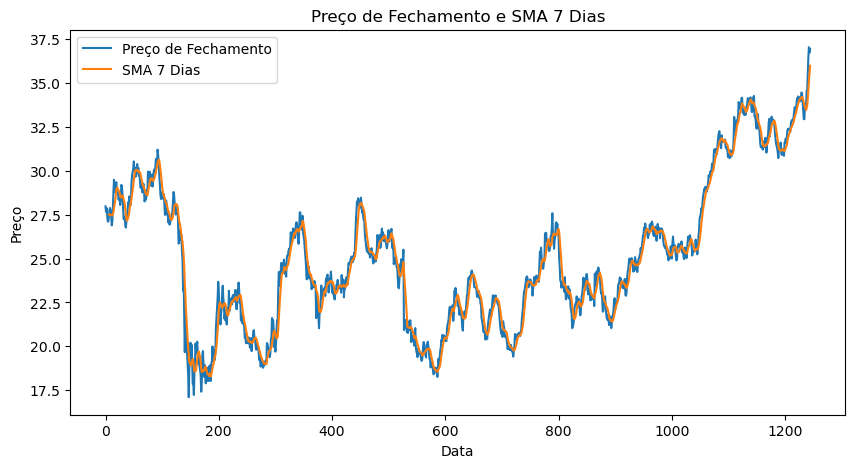

In [37]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['SMA_7'].plot(label='SMA 7 Dias')
plt.title('Preço de Fechamento e SMA 7 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

sma_21

Descrição: Média móvel simples de 21 dias.

Objetivo: Identificar tendências de médio prazo.

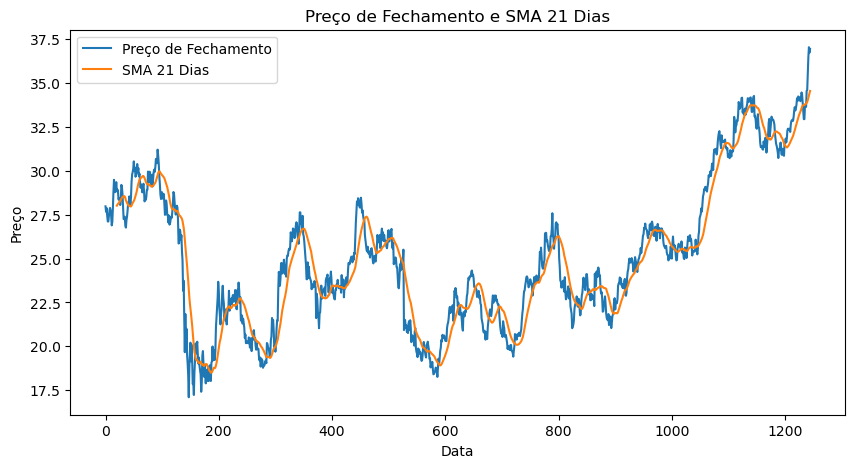

In [38]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['SMA_21'].plot(label='SMA 21 Dias')
plt.title('Preço de Fechamento e SMA 21 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

std_7

Descrição: Desvio padrão dos preços de fechamento nos últimos 7 dias.

Objetivo: Medir a volatilidade de curto prazo.

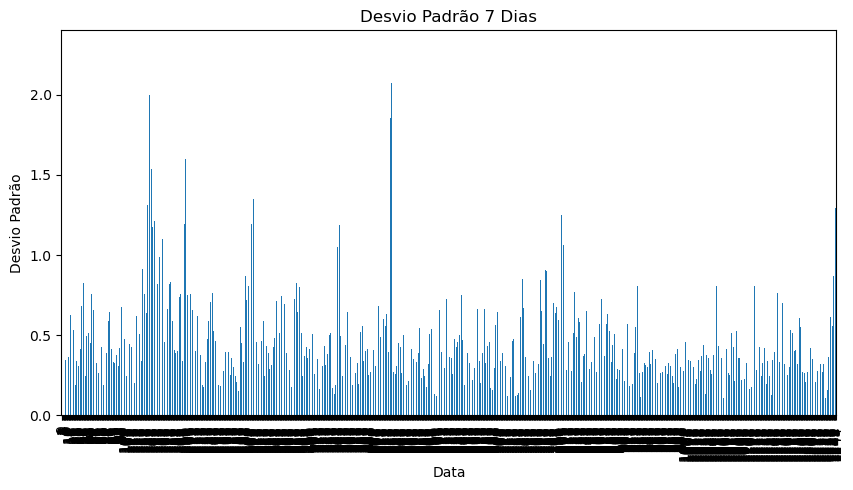

In [39]:
plt.figure(figsize=(10, 5))
df['STD_7'].plot(kind='bar')
plt.title('Desvio Padrão 7 Dias')
plt.xlabel('Data')
plt.ylabel('Desvio Padrão')
plt.show()

trend_indicator

Descrição: Indicador de tendência, onde 1 indica tendência de alta e 0 indica tendência de baixa.

Objetivo: Identificar a direção geral do mercado.

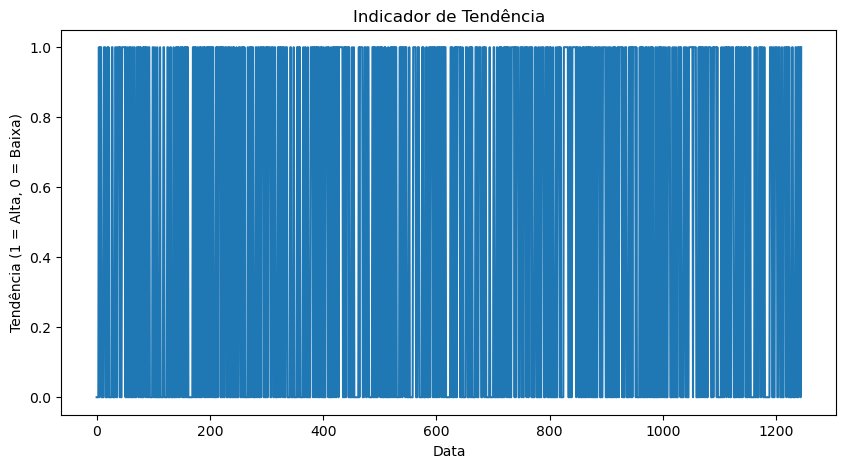

In [40]:
plt.figure(figsize=(10, 5))
df['trend_indicator'].plot()
plt.title('Indicador de Tendência')
plt.xlabel('Data')
plt.ylabel('Tendência (1 = Alta, 0 = Baixa)')
plt.show()

daily_avg_price

Descrição: Preço médio diário calculado como a média entre os preços de abertura, fechamento, alta e baixa.
    
Objetivo: Fornecer uma visão mais suavizada do preço diário.

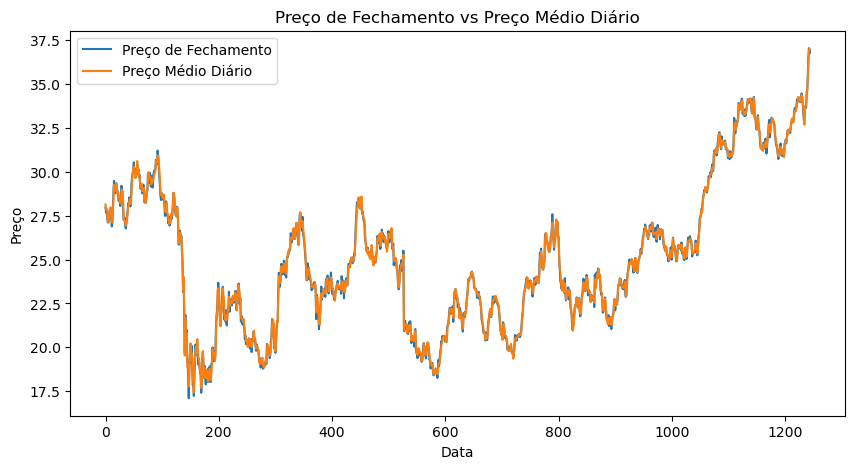

In [41]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['daily_avg_price'].plot(label='Preço Médio Diário')
plt.title('Preço de Fechamento vs Preço Médio Diário')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

cumulative_return

Descrição: Retorno acumulado ao longo do tempo.

Objetivo: Avaliar o desempenho total da ação desde o início do período.

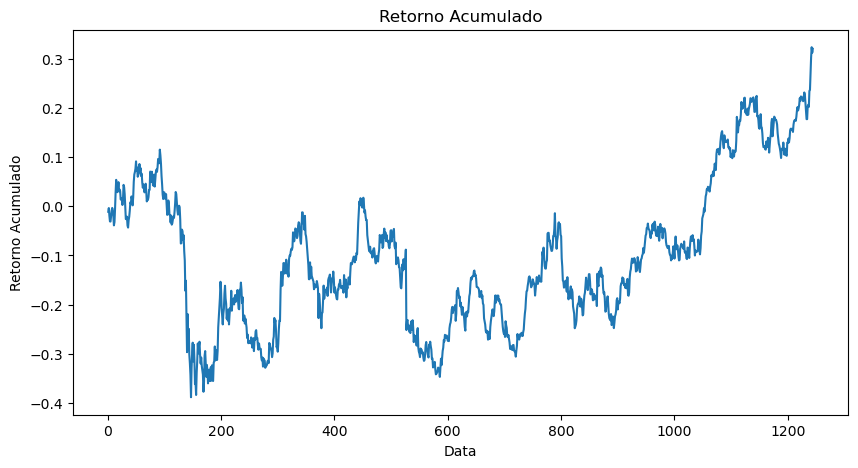

In [42]:
plt.figure(figsize=(10, 5))
df['cumulative_return'].plot()
plt.title('Retorno Acumulado')
plt.xlabel('Data')
plt.ylabel('Retorno Acumulado')
plt.show()

volume_avg_7

Descrição: Média do volume de negociações nos últimos 7 dias.
    
Objetivo: Avaliar o volume de negociações recente.

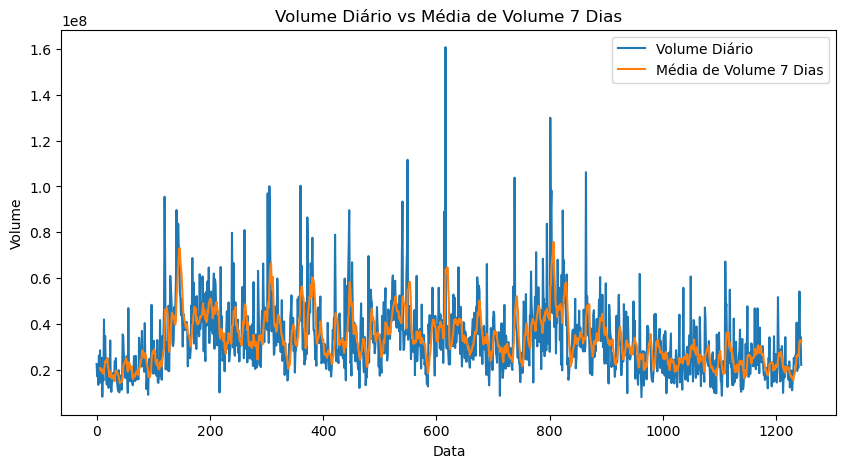

In [43]:
plt.figure(figsize=(10, 5))
df['Volume'].plot(label='Volume Diário')
df['volume_avg_7'].plot(label='Média de Volume 7 Dias')
plt.title('Volume Diário vs Média de Volume 7 Dias')
plt.xlabel('Data')
plt.ylabel('Volume')
plt.legend()
plt.show()

short_moving_average

Descrição: Média móvel curta, geralmente 12 dias.

Objetivo: Identificar tendências de curto prazo.

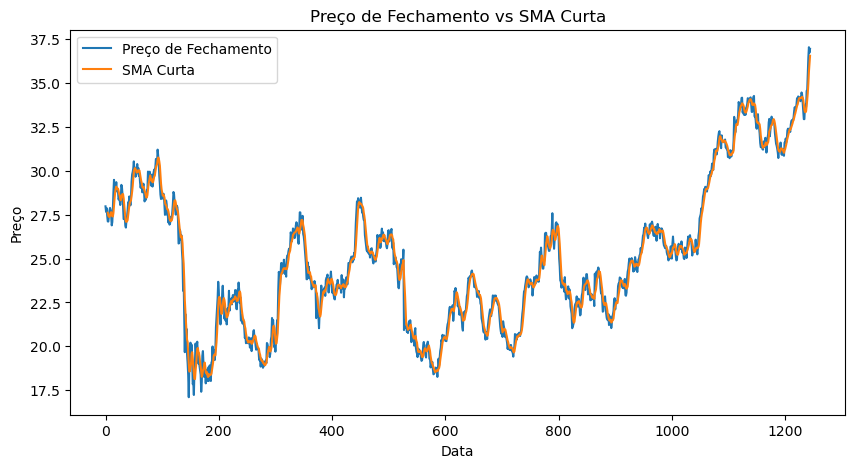

In [44]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['short_moving_average'].plot(label='SMA Curta')
plt.title('Preço de Fechamento vs SMA Curta')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

long_moving_average

Descrição: Média móvel longa, geralmente 26 dias.

Objetivo: Identificar tendências de longo prazo.

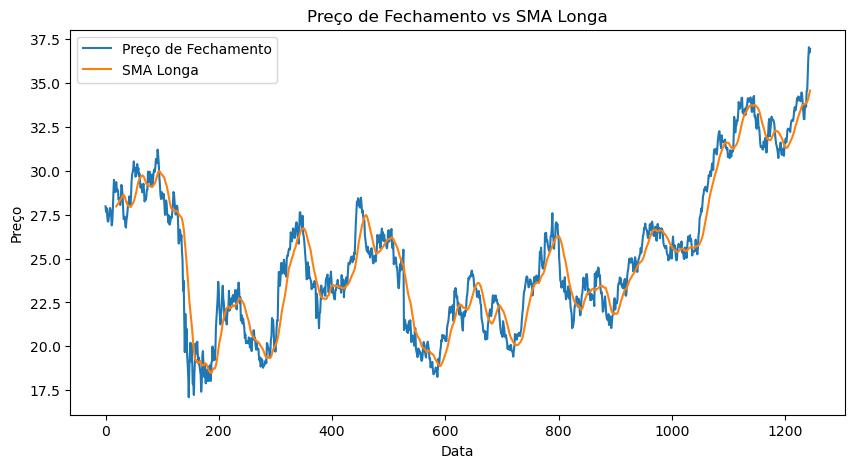

In [45]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['long_moving_average'].plot(label='SMA Longa')
plt.title('Preço de Fechamento vs SMA Longa')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

volatility

Descrição: Volatilidade dos preços de fechamento, medida pelo desvio padrão dos retornos diários.

Objetivo: Avaliar a volatilidade da ação.

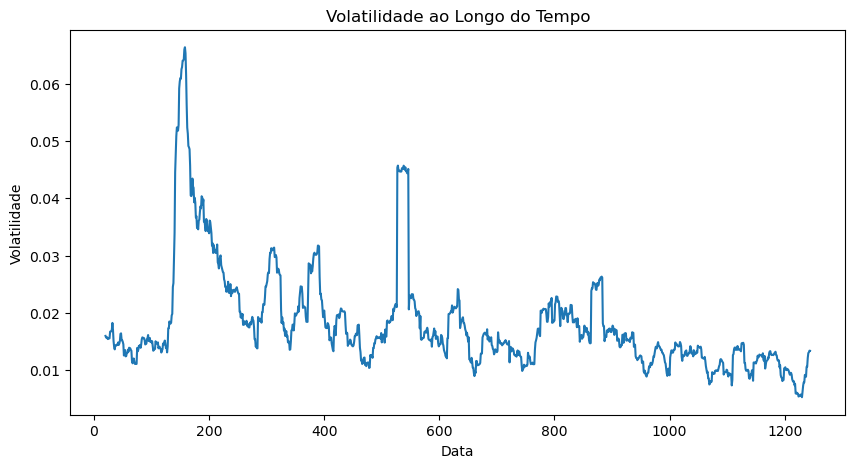

In [46]:
plt.figure(figsize=(10, 5))
df['volatility'].plot()
plt.title('Volatilidade ao Longo do Tempo')
plt.xlabel('Data')
plt.ylabel('Volatilidade')
plt.show()

ema_12

Descrição: Média Móvel Exponencial de 12 dias.

Objetivo: Identificar tendências de curto prazo.

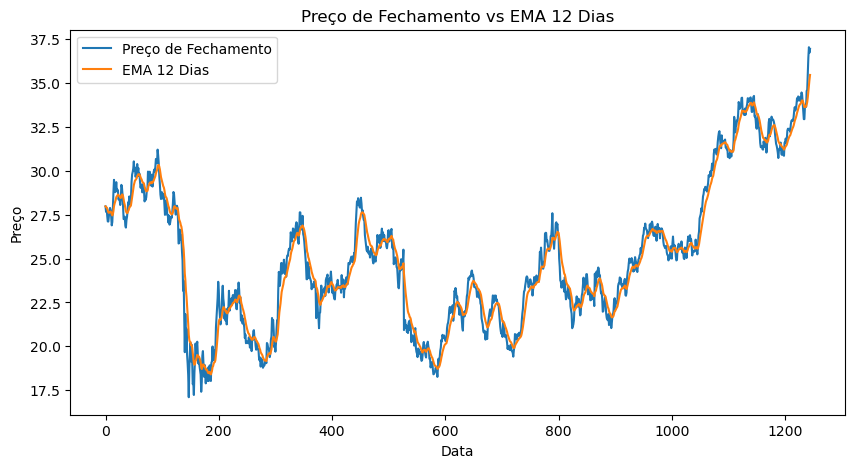

In [47]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['ema_12'].plot(label='EMA 12 Dias')
plt.title('Preço de Fechamento vs EMA 12 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

ema_26

Descrição: Média Móvel Exponencial de 26 dias.

Objetivo: Identificar tendências de médio prazo.

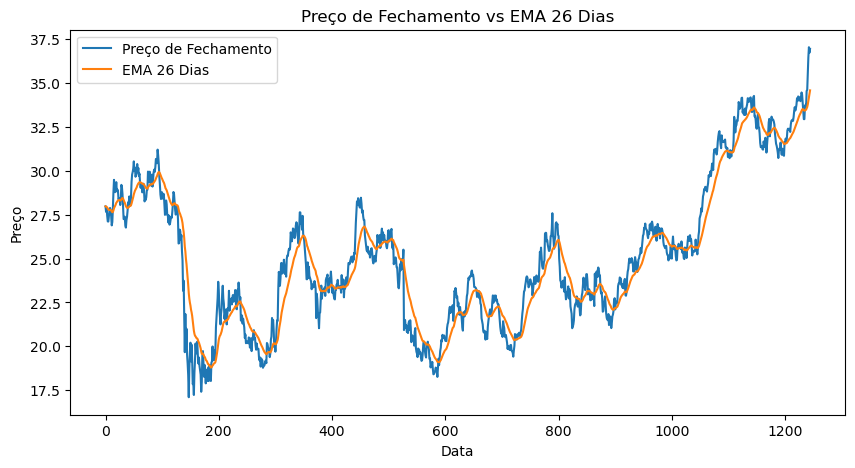

In [48]:
plt.figure(figsize=(10, 5))
df['Close'].plot(label='Preço de Fechamento')
df['ema_26'].plot(label='EMA 26 Dias')
plt.title('Preço de Fechamento vs EMA 26 Dias')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.legend()
plt.show()

MACD e Signal Line

Descrição: O gráfico de MACD (Moving Average Convergence Divergence) e Signal Line é usado para identificar sinais de compra e venda em mercados financeiros. O MACD é calculado subtraindo a média móvel exponencial (EMA) de 26 dias da EMA de 12 dias. A Signal Line é a EMA de 9 dias do MACD.

Objetivo: O gráfico ajuda a identificar pontos de cruzamento entre o MACD e a Signal Line, que indicam potenciais pontos de entrada ou saída de uma operação. Um histograma pode ser adicionado para mostrar a diferença entre o MACD e a Signal Line, destacando a força do movimento.

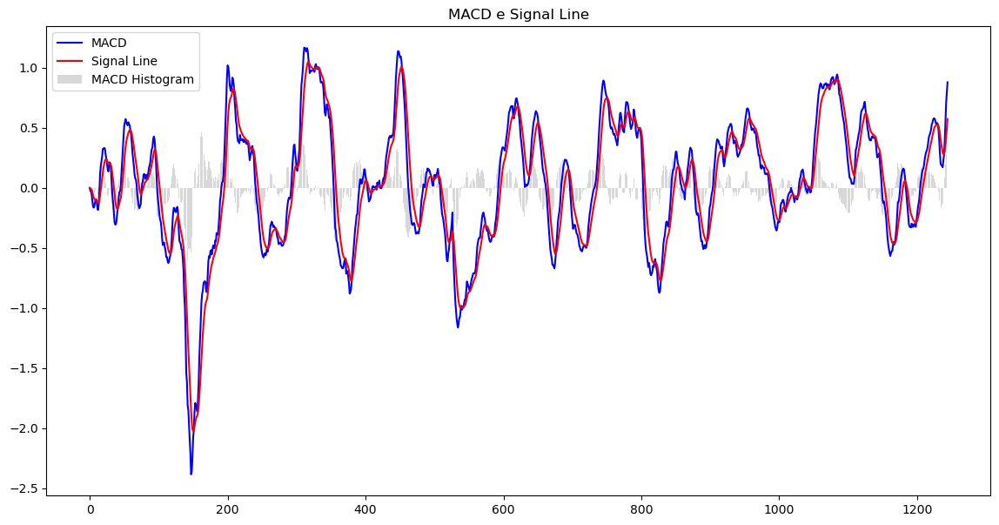

In [49]:
plt.figure(figsize=(14, 7))
plt.plot(df['macd'], label='MACD', color='blue')
plt.plot(df['signal_line'], label='Signal Line', color='red')
plt.bar(df.index, df['macd'] - df['signal_line'], label='MACD Histogram', color='gray', alpha=0.3)
plt.title('MACD e Signal Line')
plt.legend(loc='upper left')
plt.show()

RSI (Relative Strength Index)

Descrição: O RSI (Índice de Força Relativa) é um indicador de momentum que mede a velocidade e a mudança dos movimentos de preço. Ele varia de 0 a 100 e é geralmente usado para identificar condições de sobrecompra ou sobrevenda.

Objetivo: O gráfico de RSI é utilizado para identificar quando um ativo está sobrecomprado (acima de 70) ou sobrevendido (abaixo de 30). Esses níveis podem sinalizar uma possível reversão de tendência.

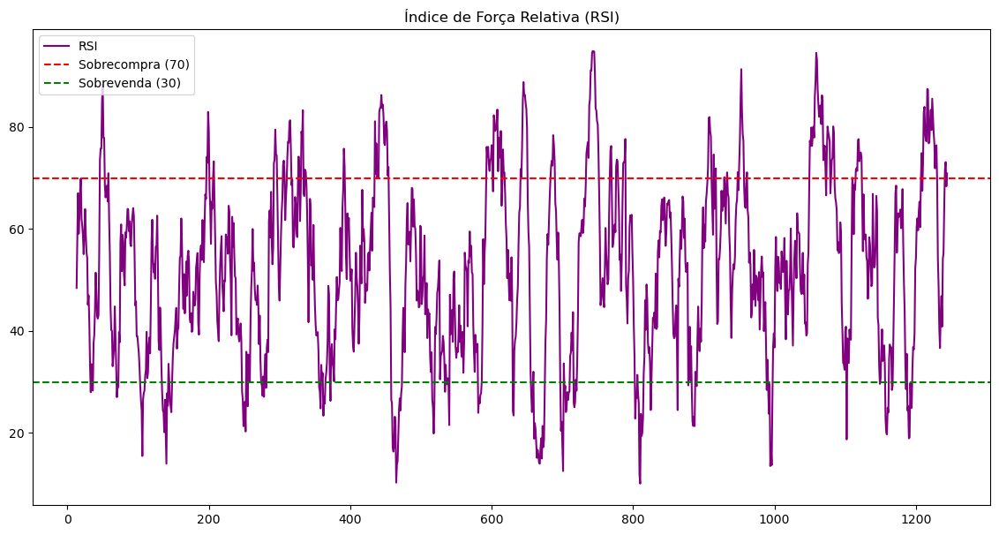

In [50]:
plt.figure(figsize=(14, 7))
plt.plot(df['rsi'], label='RSI', color='purple')
plt.axhline(70, color='red', linestyle='--', label='Sobrecompra (70)')
plt.axhline(30, color='green', linestyle='--', label='Sobrevenda (30)')
plt.title('Índice de Força Relativa (RSI)')
plt.legend(loc='upper left')
plt.show()

Bollinger Bands (Upper & Lower)

Descrição: As Bollinger Bands consistem em uma média móvel simples (SMA) e duas bandas (superior e inferior) que representam desvio padrão acima e abaixo da SMA. Essas bandas se ajustam à volatilidade do mercado.

Objetivo: O gráfico de Bollinger Bands é usado para visualizar a volatilidade e potenciais pontos de reversão. Quando o preço se aproxima ou ultrapassa as bandas, isso pode indicar que o ativo está sobrecomprado ou sobrevendido.

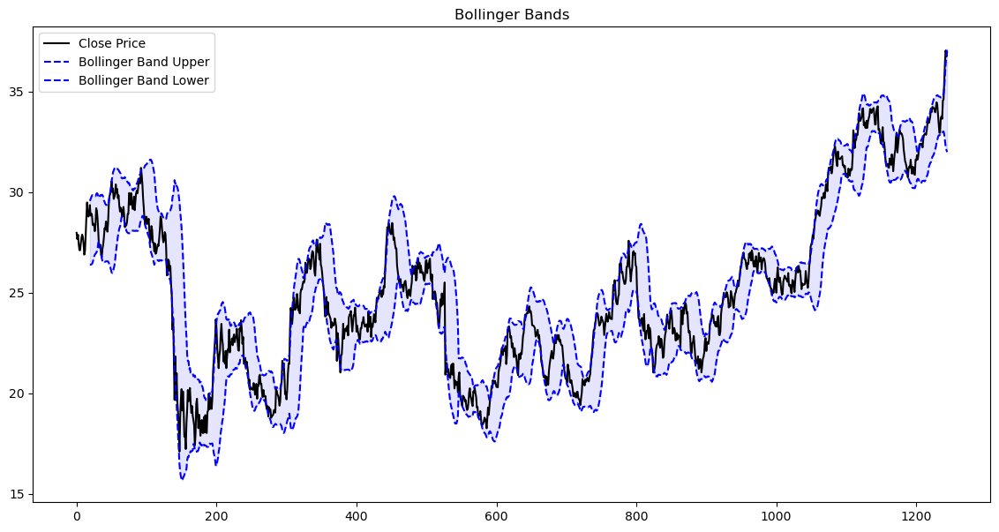

In [51]:
plt.figure(figsize=(14, 7))
plt.plot(df['Close'], label='Close Price', color='black')
plt.plot(df['bollinger_band_upper'], label='Bollinger Band Upper', color='blue', linestyle='--')
plt.plot(df['bollinger_band_lower'], label='Bollinger Band Lower', color='blue', linestyle='--')
plt.fill_between(df.index, df['bollinger_band_upper'], df['bollinger_band_lower'], color='blue', alpha=0.1)
plt.title('Bollinger Bands')
plt.legend(loc='upper left')
plt.show()


Average True Range (ATR)

Descrição: O Average True Range (ATR) é um indicador de volatilidade que mede a amplitude média de oscilação de um ativo durante um período específico.

Objetivo: O gráfico de ATR é utilizado para avaliar a volatilidade do mercado. Um aumento no ATR indica maior volatilidade, enquanto uma diminuição sugere um mercado mais estável.

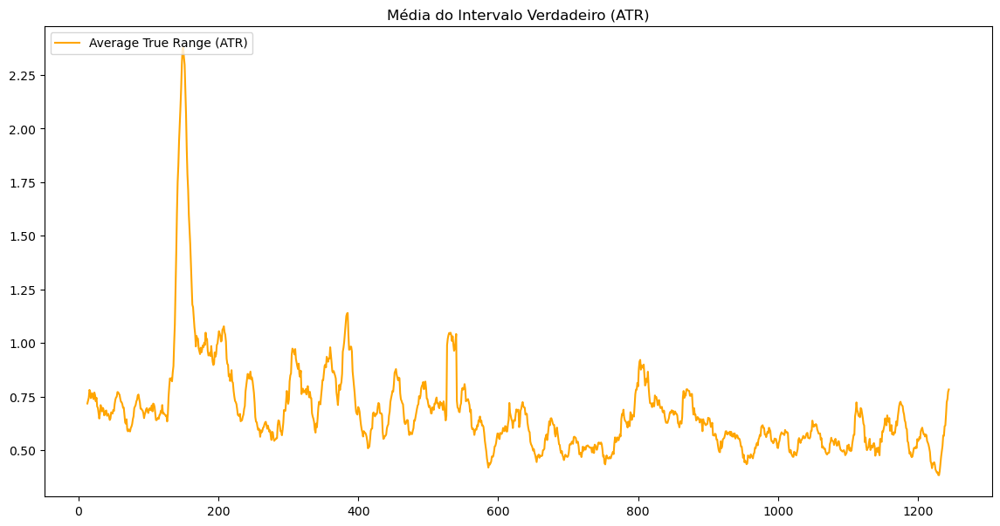

In [52]:
plt.figure(figsize=(14, 7))
plt.plot(df['average_true_range'], label='Average True Range (ATR)', color='orange')
plt.title('Média do Intervalo Verdadeiro (ATR)')
plt.legend(loc='upper left')
plt.show()

Moving Average Convergence (MAC)

Descrição: A Moving Average Convergence (MAC) compara duas médias móveis de preços, uma de curto e outra de longo prazo, para identificar a direção e a força de uma tendência.

Objetivo: O gráfico que mostra as médias móveis de curto e longo prazo junto com a convergência entre elas é útil para identificar mudanças de tendência e avaliar a força dessa tendência.

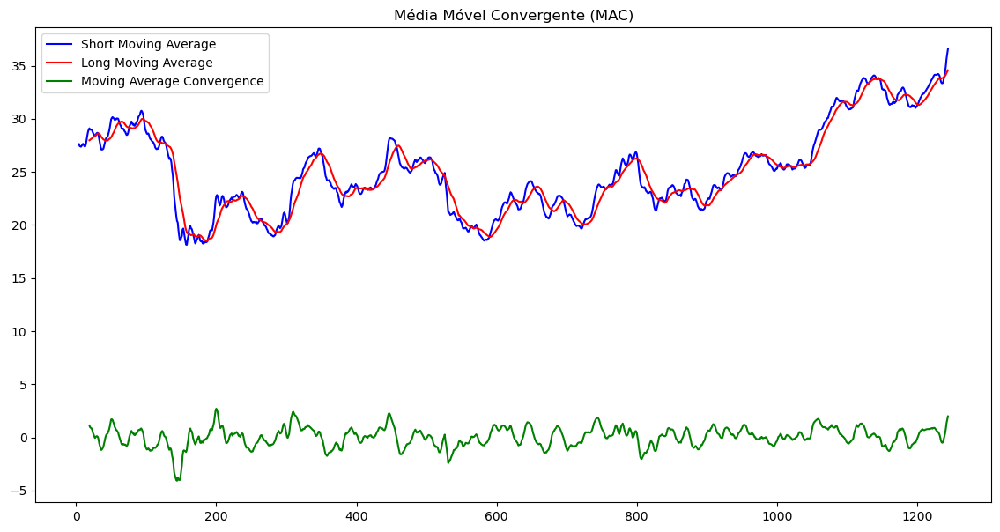

In [53]:
plt.figure(figsize=(14, 7))
plt.plot(df['short_moving_average'], label='Short Moving Average', color='blue')
plt.plot(df['long_moving_average'], label='Long Moving Average', color='red')
plt.plot(df['moving_average_convergence'], label='Moving Average Convergence', color='green')
plt.title('Média Móvel Convergente (MAC)')
plt.legend(loc='upper left')
plt.show()

Momentum

Descrição: O Momentum é um indicador que mede a velocidade das mudanças de preço de um ativo. Ele é calculado como a diferença entre o preço atual e o preço de fechamento anterior.

Objetivo: O gráfico de Momentum é utilizado para identificar a força da tendência. Valores positivos indicam uma tendência de alta, enquanto valores negativos sugerem uma tendência de baixa.

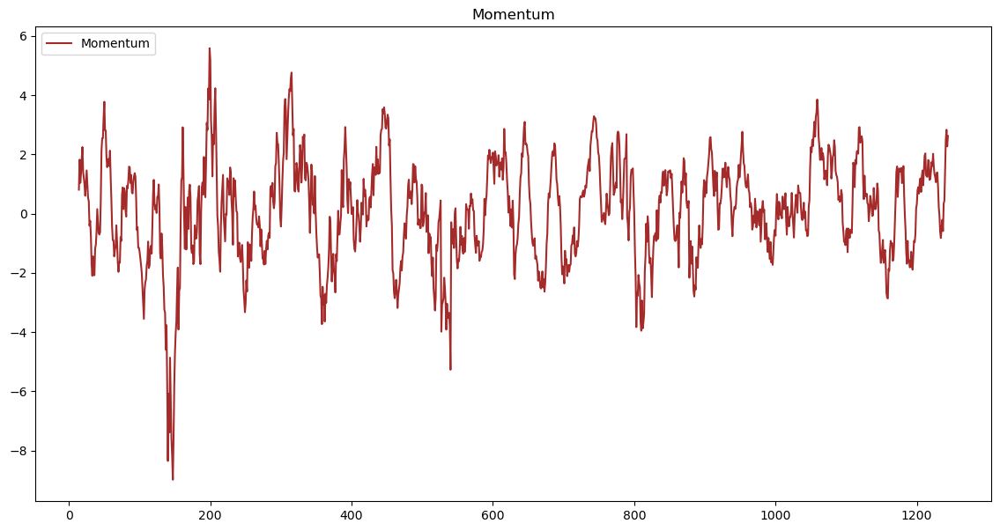

In [54]:
plt.figure(figsize=(14, 7))
plt.plot(df['momentum'], label='Momentum', color='brown')
plt.title('Momentum')
plt.legend(loc='upper left')
plt.show()

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1245 non-null   float64                          
 2   High                        1245 non-null   float64                          
 3   Low                         1245 non-null   float64                          
 4   Close                       1245 non-null   float64                          
 5   Volume                      1245 non-null   int64                            
 6   Dividends                   1245 non-null   float64                          
 7   Stock Splits                1245 non-null   float64                          
 8   daily_return                1244 non-null   float64       

Average Directional Index (ADX)

Descrição: O ADX é um indicador de tendência que mede a força da tendência atual, sem indicar se a tendência é de alta ou baixa.

Objetivo: O ADX é útil para identificar se o mercado está em uma tendência forte (quando o ADX é maior que 20) ou em uma fase lateral (quando o ADX é menor que 20).

In [56]:
!pip install ta

In [57]:
from ta.trend import ADXIndicator

adx = ADXIndicator(df['High'], df['Low'], df['Close'], window=14)

df['adx'] = adx.adx()

Commodity Channel Index (CCI)

Descrição: O CCI mede a variação do preço atual em relação à sua média móvel. É utilizado para identificar condições de sobrecompra ou sobrevenda.

Objetivo: Ajuda a identificar pontos de reversão de tendência e também pode ser usado para detectar divergências entre o preço e o indicador.

In [58]:
from ta.trend import CCIIndicator

cci = CCIIndicator(df['High'], df['Low'], df['Close'], window=20)
df['cci'] = cci.cci()

Fibonacci Retracement Levels

Descrição: Os níveis de Fibonacci são baseados na sequência de Fibonacci e são usados para identificar possíveis níveis de suporte e resistência.

Objetivo: São frequentemente usados para prever reversões de preço em níveis específicos.

In [59]:
# Exemplo básico para calcular os níveis de Fibonacci
max_price = df['High'].max()
min_price = df['Low'].min()
difference = max_price - min_price

df['fib_23.6'] = max_price - difference * 0.236
df['fib_38.2'] = max_price - difference * 0.382
df['fib_50.0'] = max_price - difference * 0.5
df['fib_61.8'] = max_price - difference * 0.618
df['fib_100'] = min_price

Williams %R

Descrição: O Williams %R é um indicador de momentum que mostra o nível de fechamento em relação à faixa alta/baixa nos últimos n períodos.

Objetivo: Similar ao RSI, ele é usado para identificar condições de sobrecompra ou sobrevenda.

In [60]:
from ta.momentum import WilliamsRIndicator

williams_r = WilliamsRIndicator(df['High'], df['Low'], df['Close'], lbp=14)
df['williams_r'] = williams_r.williams_r()

Chaikin Money Flow (CMF)

Descrição: O CMF mede a pressão de compra e venda ao comparar os preços de fechamento com as altas e baixas diárias, ponderados pelo volume.

Objetivo: É utilizado para confirmar tendências e detectar a força do movimento do preço.

In [61]:
from ta.volume import ChaikinMoneyFlowIndicator

cmf = ChaikinMoneyFlowIndicator(df['High'], df['Low'], df['Close'], df['Volume'], window=20)
df['cmf'] = cmf.chaikin_money_flow()

On-Balance Volume (OBV)

Descrição: O OBV é um indicador de volume que combina o volume com os movimentos de preço.

Objetivo: O OBV ajuda a identificar divergências entre o volume e o movimento de preço, o que pode sinalizar uma reversão.

In [62]:
df['obv'] = (np.sign(df['Close'].diff()) * df['Volume']).cumsum()

Ichimoku Cloud

Ichimoku Conversion Line (Tenkan-sen)

Descrição: Calcula a média entre a máxima e a mínima nos últimos 9 períodos.

Objetivo: Identificar tendências de curto prazo.

Ichimoku Base Line (Kijun-sen)

Descrição: Calcula a média entre a máxima e a mínima nos últimos 26 períodos.

Objetivo: Identificar tendências de médio prazo.

Leading Span A (Senkou Span A)

Descrição: Calcula a média da linha de conversão e da linha de base, projetando 26 períodos à frente.

Objetivo: Junto com o Leading Span B, forma a nuvem que é usada para identificar suporte e resistência futuros.

Leading Span B (Senkou Span B)

Descrição: Calcula a média entre a máxima e a mínima dos últimos 52 períodos, projetando 26 períodos à frente.

Objetivo: Forma a segunda linha da nuvem para identificar níveis de suporte e resistência mais distantes.

In [63]:
from ta.trend import IchimokuIndicator

# Configurando o IchimokuIndicator com parâmetros corretos
ichimoku = IchimokuIndicator(high=df['High'], low=df['Low'], window1=9, window2=26, window3=52, visual=False, fillna=False)

# Calculando os componentes do Ichimoku Cloud
df['ichimoku_conversion'] = ichimoku.ichimoku_conversion_line()
df['ichimoku_base'] = ichimoku.ichimoku_base_line()
df['ichimoku_a'] = ichimoku.ichimoku_a()
df['ichimoku_b'] = ichimoku.ichimoku_b()

ADX (Average Directional Index)

Descrição da Visualização:
O gráfico exibe o ADX junto com o preço de fechamento.

Objetivo:
O ADX é usado para medir a força de uma tendência. Um valor de ADX acima de 25 geralmente indica uma tendência forte, enquanto valores abaixo de 20 indicam uma tendência fraca ou um mercado lateral.

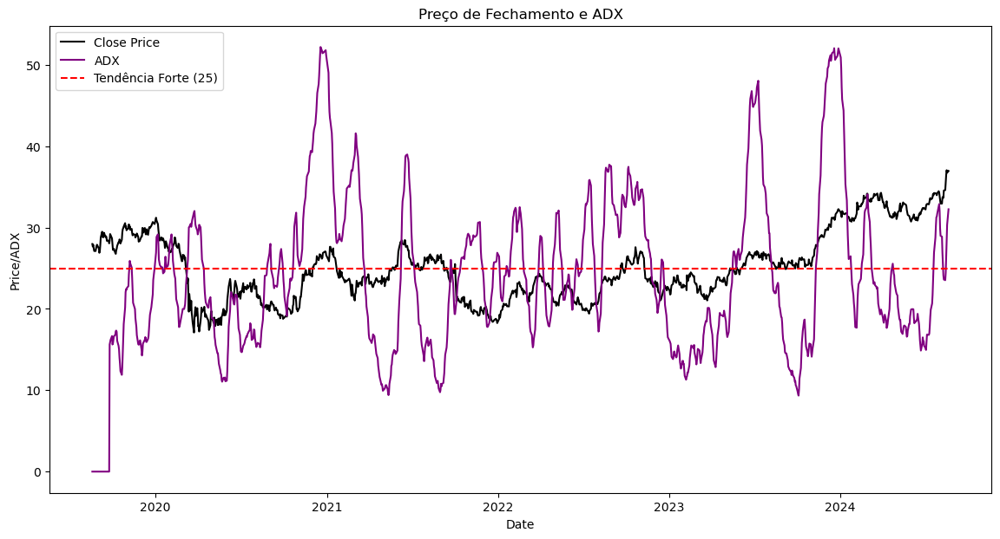

In [64]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['adx'], label='ADX', color='purple')
plt.axhline(y=25, color='red', linestyle='--', label='Tendência Forte (25)')
plt.title('Preço de Fechamento e ADX')
plt.xlabel('Date')
plt.ylabel('Price/ADX')
plt.legend()
plt.show()

CCI (Commodity Channel Index)

Descrição da Visualização:
Este gráfico mostra o CCI com a linha de preço de fechamento.

Objetivo:
O CCI é usado para identificar condições de sobrecompra e sobrevenda. Valores acima de +100 indicam sobrecompra, enquanto valores abaixo de -100 indicam sobrevenda.

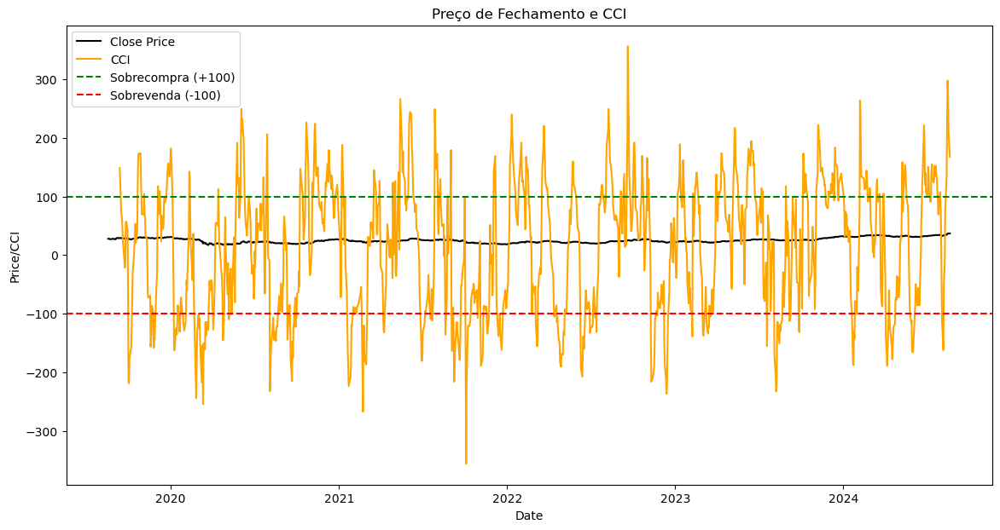

In [65]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['cci'], label='CCI', color='orange')
plt.axhline(y=100, color='green', linestyle='--', label='Sobrecompra (+100)')
plt.axhline(y=-100, color='red', linestyle='--', label='Sobrevenda (-100)')
plt.title('Preço de Fechamento e CCI')
plt.xlabel('Date')
plt.ylabel('Price/CCI')
plt.legend()
plt.show()

Fibonacci Retracement Levels

Descrição da Visualização:
O gráfico exibe os níveis de retração de Fibonacci (23.6%, 38.2%, 50.0%, 61.8%, e 100%) sobrepostos ao preço de fechamento.

Objetivo:
Os níveis de retração de Fibonacci são usados para identificar possíveis níveis de suporte e resistência, que podem ser pontos de reversão de preços.

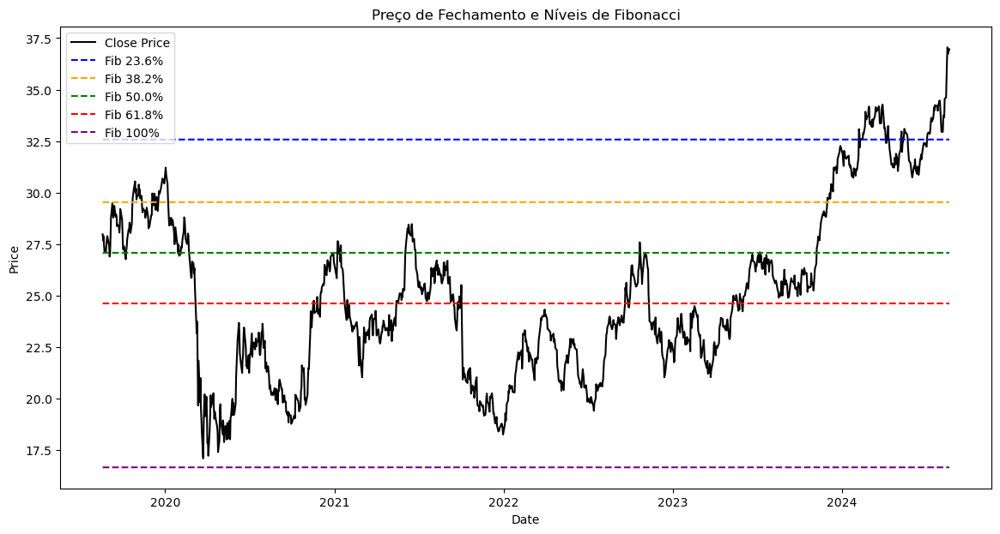

In [66]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['fib_23.6'], label='Fib 23.6%', linestyle='--', color='blue')
plt.plot(df['Date'], df['fib_38.2'], label='Fib 38.2%', linestyle='--', color='orange')
plt.plot(df['Date'], df['fib_50.0'], label='Fib 50.0%', linestyle='--', color='green')
plt.plot(df['Date'], df['fib_61.8'], label='Fib 61.8%', linestyle='--', color='red')
plt.plot(df['Date'], df['fib_100'], label='Fib 100%', linestyle='--', color='purple')
plt.title('Preço de Fechamento e Níveis de Fibonacci')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Williams %R

Descrição da Visualização:
Este gráfico mostra o indicador Williams %R com a linha de preço de fechamento.

Objetivo:
Williams %R é usado para identificar condições de sobrecompra e sobrevenda. Valores abaixo de -80 indicam sobrevenda, enquanto valores acima de -20 indicam sobrecompra.

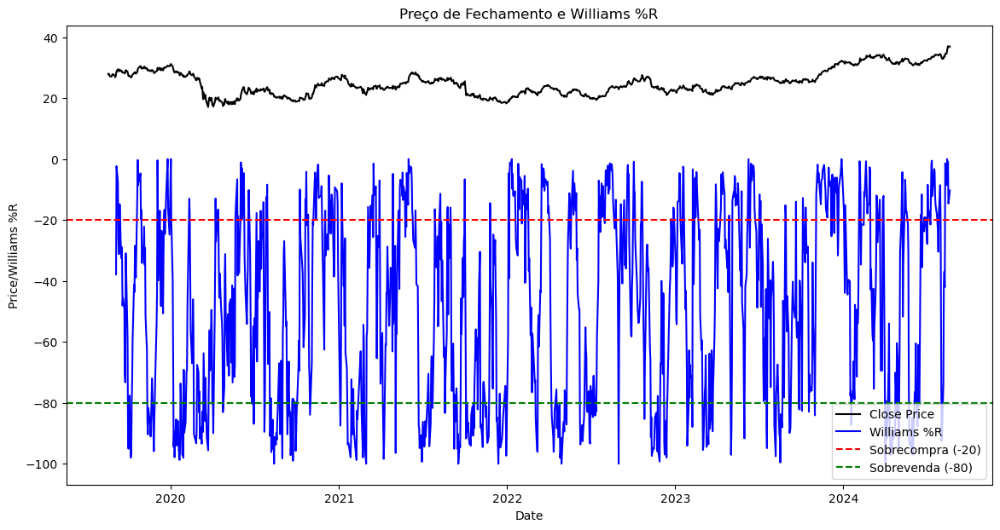

In [67]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['williams_r'], label='Williams %R', color='blue')
plt.axhline(y=-20, color='red', linestyle='--', label='Sobrecompra (-20)')
plt.axhline(y=-80, color='green', linestyle='--', label='Sobrevenda (-80)')
plt.title('Preço de Fechamento e Williams %R')
plt.xlabel('Date')
plt.ylabel('Price/Williams %R')
plt.legend()
plt.show()

Chaikin Money Flow (CMF)

Descrição da Visualização:
O gráfico exibe o CMF com o preço de fechamento.

Objetivo:
O CMF mede o fluxo de dinheiro em uma ação ao longo do tempo. Valores positivos indicam pressão de compra, enquanto valores negativos indicam pressão de venda.

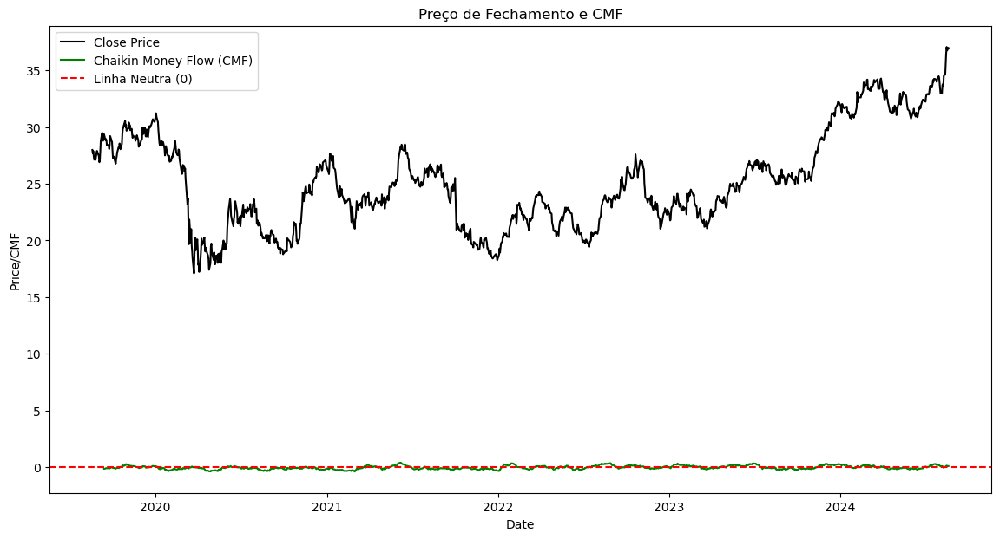

In [68]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['cmf'], label='Chaikin Money Flow (CMF)', color='green')
plt.axhline(y=0, color='red', linestyle='--', label='Linha Neutra (0)')
plt.title('Preço de Fechamento e CMF')
plt.xlabel('Date')
plt.ylabel('Price/CMF')
plt.legend()
plt.show()

On-Balance Volume (OBV)

Descrição da Visualização:
Este gráfico mostra o OBV com a linha de preço de fechamento.

Objetivo:
O OBV é um indicador de momento que relaciona o volume ao movimento do preço. Ele é usado para confirmar tendências de preços, onde um aumento no OBV sugere que a tendência de alta é suportada pelo volume.

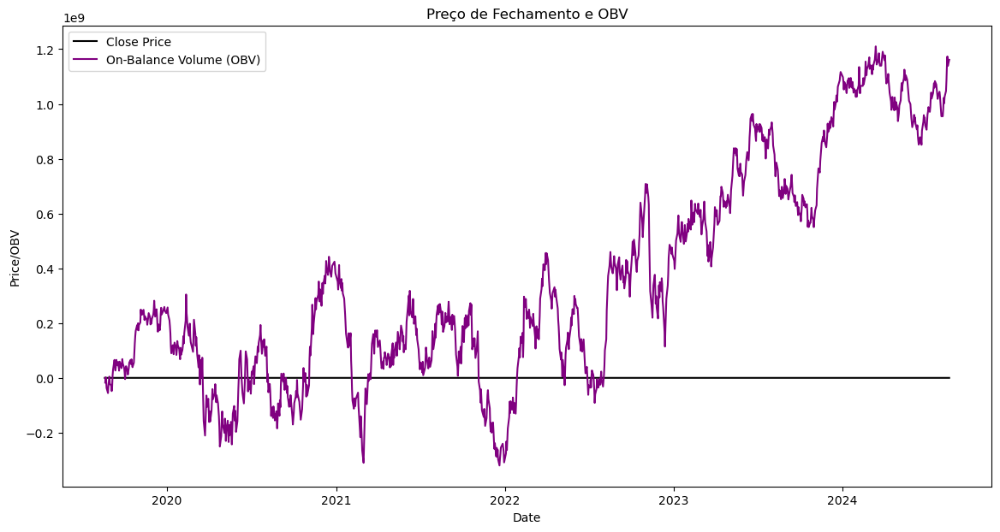

In [69]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['obv'], label='On-Balance Volume (OBV)', color='purple')
plt.title('Preço de Fechamento e OBV')
plt.xlabel('Date')
plt.ylabel('Price/OBV')
plt.legend()
plt.show()

Ichimoku Indicator (Todos os Componentes)

Descrição da Visualização:
Este gráfico combina todas as componentes do Ichimoku Indicator: Ichimoku Conversion Line, Ichimoku Base Line, Senkou Span A e Senkou Span B, sobre o gráfico de preços.

Objetivo:
Este gráfico fornece uma visão completa do indicador Ichimoku, permitindo que o usuário identifique a tendência atual, possíveis suportes e resistências, bem como os pontos de reversão potenciais.

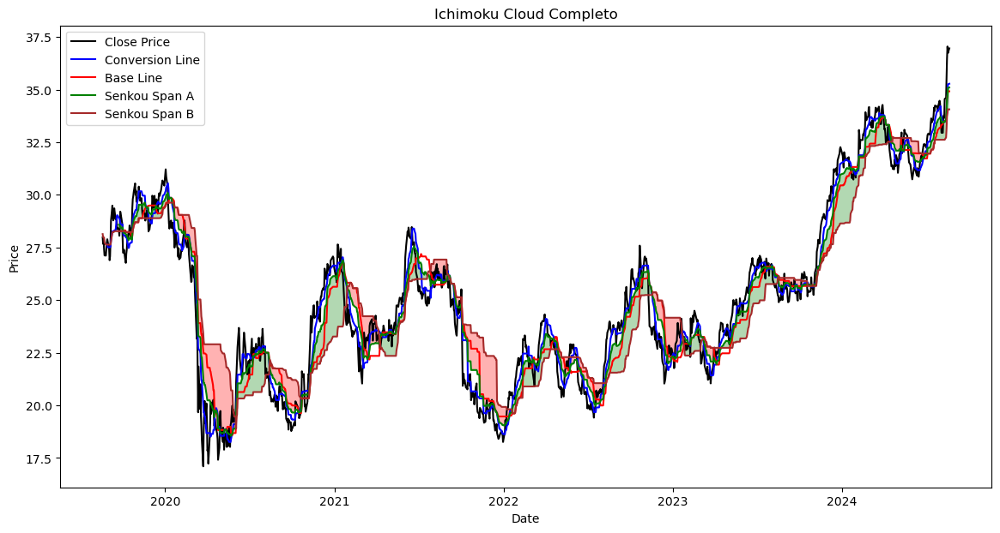

In [70]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='black')
plt.plot(df['Date'], df['ichimoku_conversion'], label='Conversion Line', color='blue')
plt.plot(df['Date'], df['ichimoku_base'], label='Base Line', color='red')
plt.plot(df['Date'], df['ichimoku_a'], label='Senkou Span A', color='green')
plt.plot(df['Date'], df['ichimoku_b'], label='Senkou Span B', color='brown')
plt.fill_between(df['Date'], df['ichimoku_a'], df['ichimoku_b'], where=(df['ichimoku_a'] >= df['ichimoku_b']), facecolor='green', alpha=0.3)
plt.fill_between(df['Date'], df['ichimoku_a'], df['ichimoku_b'], where=(df['ichimoku_a'] < df['ichimoku_b']), facecolor='red', alpha=0.3)
plt.title('Ichimoku Cloud Completo')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 45 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1245 non-null   float64                          
 2   High                        1245 non-null   float64                          
 3   Low                         1245 non-null   float64                          
 4   Close                       1245 non-null   float64                          
 5   Volume                      1245 non-null   int64                            
 6   Dividends                   1245 non-null   float64                          
 7   Stock Splits                1245 non-null   float64                          
 8   daily_return                1244 non-null   float64       

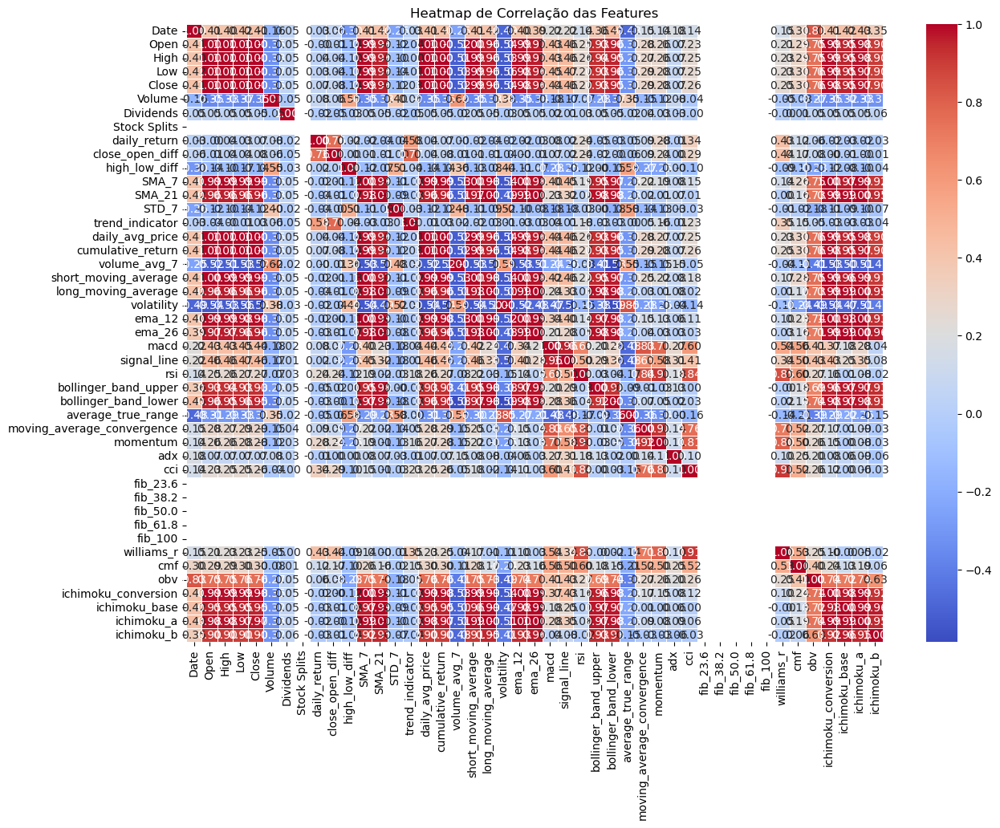

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcula a matriz de correlação
correlation_matrix = df.corr()

# Define o tamanho da figura
plt.figure(figsize=(14, 10))

# Cria o heatmap com anotações
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Adiciona o título ao gráfico
plt.title('Heatmap de Correlação das Features')
plt.show()

Parabolic SAR

Descrição: O Parabolic SAR (Stop and Reverse) é um indicador que ajuda a identificar a direção de uma tendência e potenciais pontos de reversão. Ele é útil para definir pontos de entrada e saída em uma posição.

Objetivo: Este indicador é particularmente útil em mercados com tendência bem definida e pode ajudar o modelo a identificar mudanças na direção da tendência.

In [73]:
from ta.trend import PSARIndicator

# Adiciona o Parabolic SAR ao dataframe
psar = PSARIndicator(df['High'], df['Low'], df['Close'], step=0.02, max_step=0.2)
df['parabolic_sar'] = psar.psar()

ADX com DI+ e DI-

Descrição: O ADX (Average Directional Index) mede a força de uma tendência, enquanto o DI+ (Directional Indicator Plus) e o DI- (Directional Indicator Minus) indicam a direção da tendência.

Objetivo: Esses indicadores ajudam o modelo a distinguir entre tendências fortes e fracas, além de identificar a direção da tendência, o que é essencial para estratégias de tendência.

In [74]:
from ta.trend import ADXIndicator

# Adiciona ADX, DI+ e DI- ao dataframe
adx = ADXIndicator(df['High'], df['Low'], df['Close'], window=14)
df['adx'] = adx.adx()
df['di_plus'] = adx.adx_pos()
df['di_minus'] = adx.adx_neg()

Elder's Force Index

Descrição: O Elder's Force Index combina preço e volume para medir a força por trás dos movimentos de preço. É útil para identificar entradas e saídas em mercados com tendência.

Objetivo: Este indicador pode ajudar a identificar a força das tendências de alta e baixa, auxiliando o modelo a reconhecer movimentos de preço sustentáveis.

In [75]:
from ta.volume import ForceIndexIndicator

# Adiciona o Elder's Force Index ao dataframe
force_index = ForceIndexIndicator(df['Close'], df['Volume'], window=13)
df['elders_force_index'] = force_index.force_index()

Commodity Channel Index (CCI)

Descrição: O CCI mede a variação do preço de um ativo em relação ao seu preço médio. É útil para identificar condições de sobrecompra ou sobrevenda.

Objetivo: O CCI pode ser usado para detectar condições extremas no mercado que poderiam preceder uma reversão, fornecendo sinais de compra ou venda.

In [76]:
import pandas as pd

def calculate_cci(high, low, close, window):
    tp = (high + low + close) / 3
    cci = (tp - tp.rolling(window=window).mean()) / (0.015 * tp.rolling(window=window).std())
    return cci

df['cci'] = calculate_cci(df['High'], df['Low'], df['Close'], window=20)

Vortex Indicator (VI+ e VI-)

Descrição: O Vortex Indicator consiste em dois componentes, VI+ e VI-, que identificam a força e a direção de uma tendência.

Objetivo: Este indicador pode ajudar a identificar reversões de tendência e confirmar a força de uma tendência atual.

In [77]:
from ta.trend import VortexIndicator

# Adiciona o Vortex Indicator ao dataframe
vortex = VortexIndicator(df['High'], df['Low'], df['Close'], window=14)
df['vortex_plus'] = vortex.vortex_indicator_pos()
df['vortex_minus'] = vortex.vortex_indicator_neg()

Money Flow Index (MFI)

Descrição: O MFI é um indicador de momentum que utiliza tanto preço quanto volume para medir a pressão de compra e venda.

Objetivo: O MFI é útil para identificar condições de sobrecompra ou sobrevenda e pode ajudar a prever reversões de preço.

In [78]:
from ta.volume import MFIIndicator

# Adiciona o Money Flow Index ao dataframe
mfi = MFIIndicator(df['High'], df['Low'], df['Close'], df['Volume'], window=14)
df['mfi'] = mfi.money_flow_index()

True Strength Index (TSI)

Descrição: O TSI é um indicador de momentum que suaviza os movimentos de preço para ajudar a identificar tendências e possíveis reversões.

Objetivo: O TSI pode ser usado para confirmar a direção da tendência e detectar pontos de reversão de maneira mais precisa.

In [79]:
from ta.momentum import TSIIndicator

# Adiciona o True Strength Index ao dataframe
tsi = TSIIndicator(df['Close'], window_slow=25, window_fast=13)
df['tsi'] = tsi.tsi()

Accumulation/Distribution Line (ADL)

Descrição: O ADL é um indicador de volume que tenta medir o fluxo de dinheiro em um ativo, considerando tanto o preço quanto o volume.

Objetivo: O ADL pode ajudar a identificar divergências entre o preço e o volume, o que pode sinalizar uma reversão iminente.

In [80]:
from ta.volume import AccDistIndexIndicator

# Adiciona o Accumulation/Distribution Line ao dataframe
adl = AccDistIndexIndicator(df['High'], df['Low'], df['Close'], df['Volume'])
df['adl'] = adl.acc_dist_index()

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1245 non-null   float64                          
 2   High                        1245 non-null   float64                          
 3   Low                         1245 non-null   float64                          
 4   Close                       1245 non-null   float64                          
 5   Volume                      1245 non-null   int64                            
 6   Dividends                   1245 non-null   float64                          
 7   Stock Splits                1245 non-null   float64                          
 8   daily_return                1244 non-null   float64       

Parabolic SAR (parabolic_sar)

Descrição do Gráfico: Um gráfico de linhas com o preço de fechamento ao longo do tempo, sobreposto ao Parabolic SAR.

Objetivo: Visualizar como o Parabolic SAR se move em relação ao preço de fechamento, ajudando a identificar possíveis pontos de reversão.

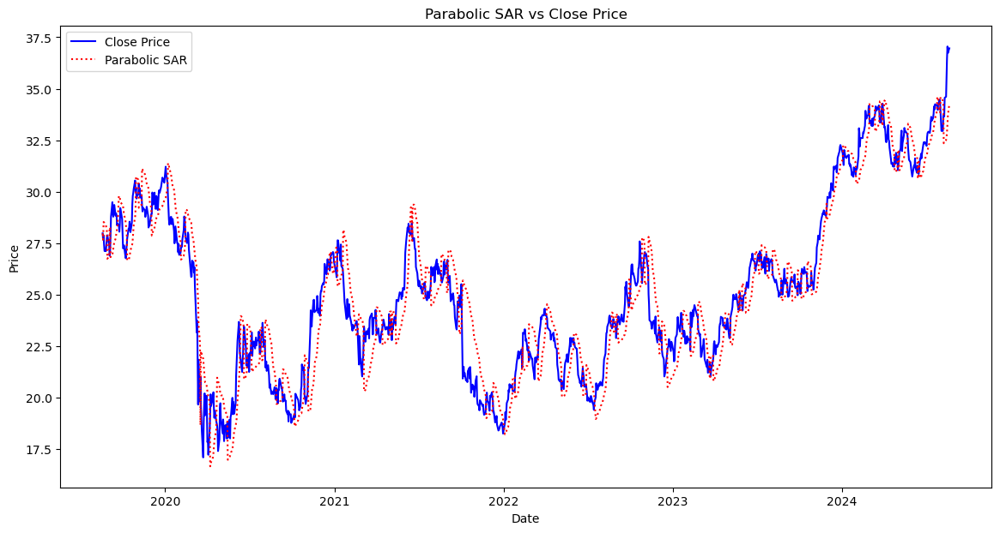

In [82]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
plt.plot(df['Date'], df['parabolic_sar'], label='Parabolic SAR', color='red', linestyle='dotted')
plt.title('Parabolic SAR vs Close Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

DI+ e DI- (di_plus, di_minus) com ADX

Descrição do Gráfico: Um gráfico de linhas mostrando DI+, DI-, e ADX ao longo do tempo.

Objetivo: Visualizar a força da tendência e identificar quando o DI+ cruza acima ou abaixo do DI-, sinalizando uma mudança na direção da tendência.

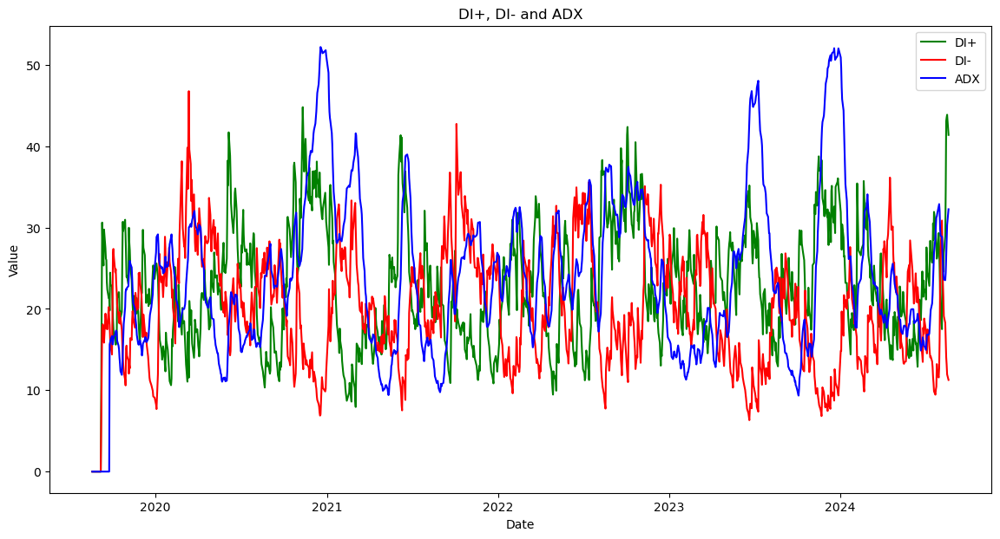

In [83]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['di_plus'], label='DI+', color='green')
plt.plot(df['Date'], df['di_minus'], label='DI-', color='red')
plt.plot(df['Date'], df['adx'], label='ADX', color='blue')
plt.title('DI+, DI- and ADX')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

Elder's Force Index (elders_force_index)

Descrição do Gráfico: Um gráfico de barras para o Elder's Force Index ao longo do tempo, sobreposto ao gráfico de preços.

Objetivo: Visualizar a força por trás dos movimentos de preço, ajudando a identificar potenciais reversões.

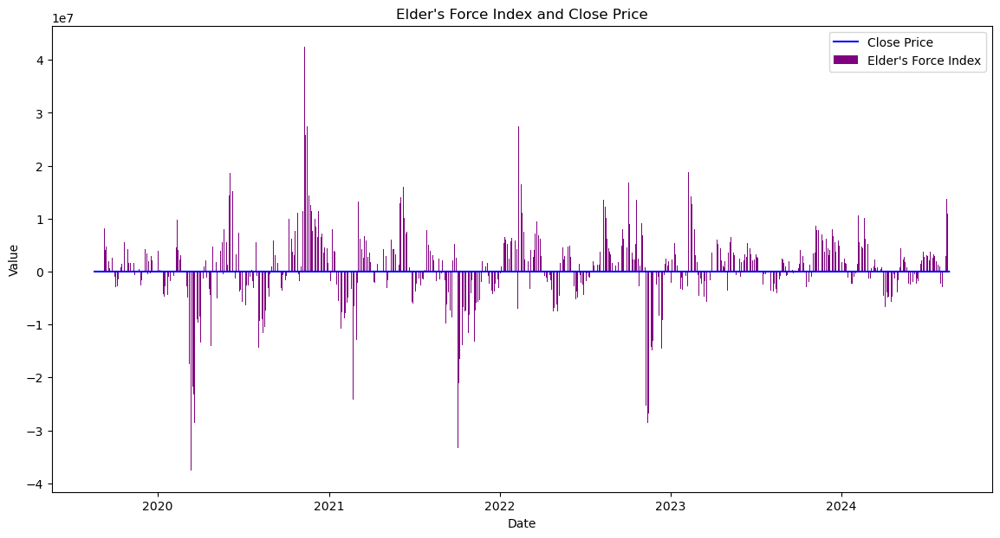

In [84]:
plt.figure(figsize=(14, 7))
plt.bar(df['Date'], df['elders_force_index'], label="Elder's Force Index", color='purple')
plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
plt.title("Elder's Force Index and Close Price")
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

Vortex Indicator (vortex_plus, vortex_minus)

Descrição do Gráfico: Um gráfico de linhas mostrando Vortex Plus e Vortex Minus ao longo do tempo.

Objetivo: Visualizar a força e direção da tendência, com cruzamentos entre Vortex Plus e Vortex Minus indicando mudanças na tendência.

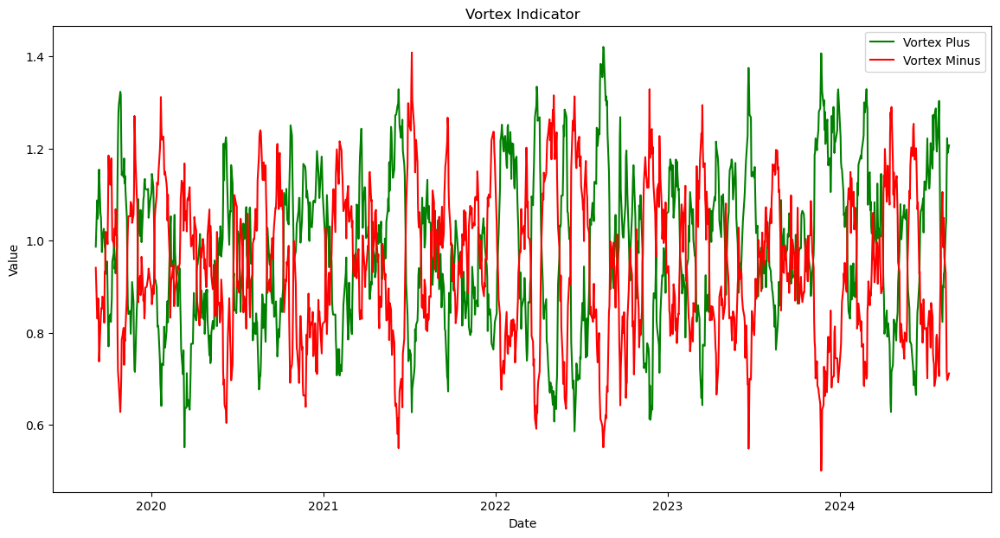

In [85]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['vortex_plus'], label='Vortex Plus', color='green')
plt.plot(df['Date'], df['vortex_minus'], label='Vortex Minus', color='red')
plt.title('Vortex Indicator')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

Money Flow Index (MFI)

Descrição do Gráfico: Um gráfico de linhas para o MFI ao longo do tempo.

Objetivo: Identificar condições de sobrecompra ou sobrevenda, onde valores acima de 80 indicam sobrecompra e abaixo de 20 indicam sobrevenda.

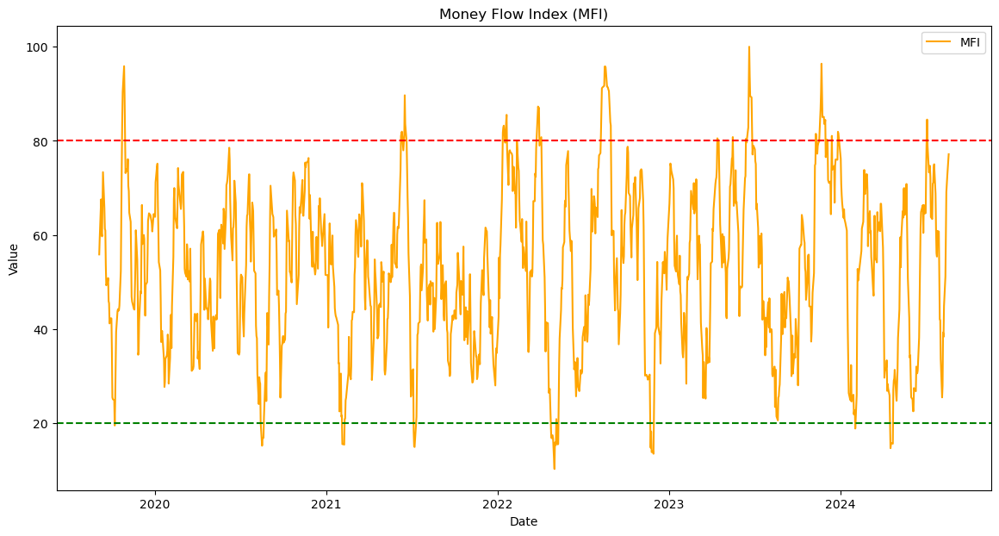

In [86]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['mfi'], label='MFI', color='orange')
plt.axhline(80, color='red', linestyle='--')
plt.axhline(20, color='green', linestyle='--')
plt.title('Money Flow Index (MFI)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

Accumulation/Distribution Line (ADL)

Descrição do Gráfico: Um gráfico de linhas mostrando o ADL ao longo do tempo.

Objetivo: Avaliar o fluxo de dinheiro no ativo, observando divergências entre o preço e o ADL, que podem sinalizar reversões.

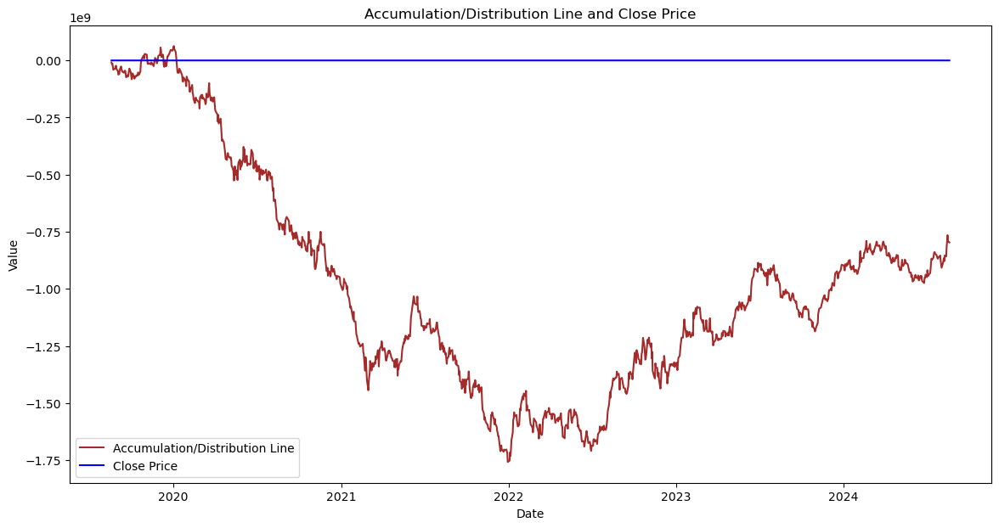

In [87]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['adl'], label='Accumulation/Distribution Line', color='brown')
plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
plt.title('Accumulation/Distribution Line and Close Price')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

True Strength Index (TSI)

Descrição do Gráfico: Um gráfico de linhas para o TSI ao longo do tempo.

Objetivo: Identificar a força da tendência e pontos de reversão, com base no momentum suavizado.

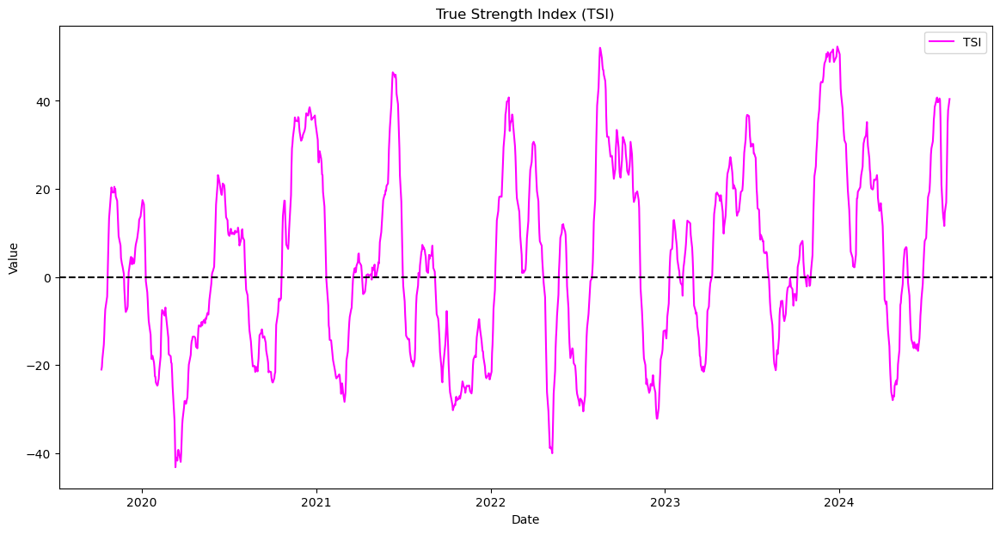

In [88]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['tsi'], label='TSI', color='magenta')
plt.axhline(0, color='black', linestyle='--')
plt.title('True Strength Index (TSI)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

Combinação de Indicadores para Melhor Interpretação

Descrição do Gráfico: Uma combinação de indicadores (por exemplo, ADX com DI+, DI-, e TSI) para fornecer uma visão abrangente da força e direção da tendência.

Objetivo: Visualizar como diferentes indicadores interagem e confirmam (ou contradizem) sinais uns dos outros, ajudando a tomar decisões mais informadas.

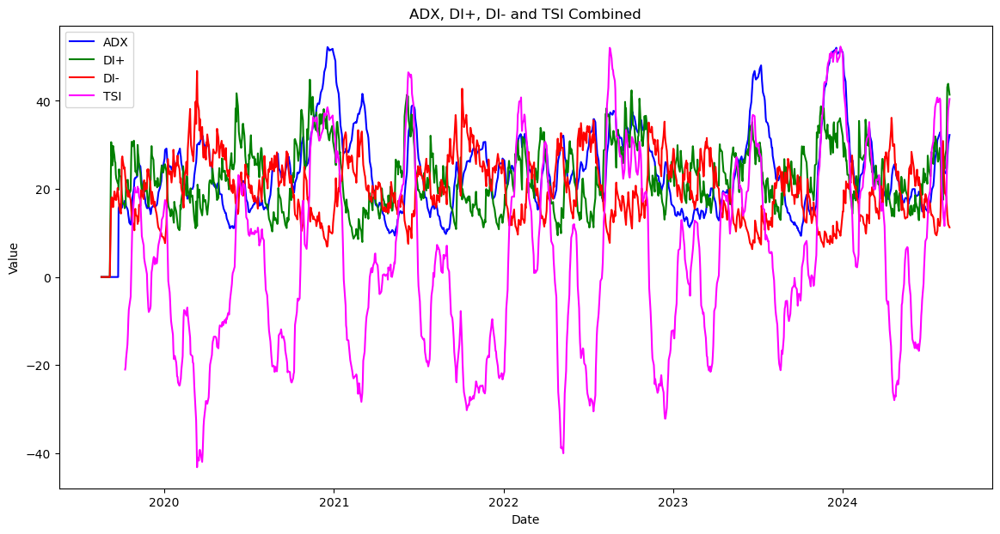

In [89]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['adx'], label='ADX', color='blue')
plt.plot(df['Date'], df['di_plus'], label='DI+', color='green')
plt.plot(df['Date'], df['di_minus'], label='DI-', color='red')
plt.plot(df['Date'], df['tsi'], label='TSI', color='magenta')
plt.title('ADX, DI+, DI- and TSI Combined')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1245 non-null   float64                          
 2   High                        1245 non-null   float64                          
 3   Low                         1245 non-null   float64                          
 4   Close                       1245 non-null   float64                          
 5   Volume                      1245 non-null   int64                            
 6   Dividends                   1245 non-null   float64                          
 7   Stock Splits                1245 non-null   float64                          
 8   daily_return                1244 non-null   float64       

Keltner Channels

Descrição: Keltner Channels são formados por uma média móvel exponencial (EMA) como a linha central e bandas acima e abaixo da EMA baseadas no Average True Range (ATR).

Objetivo: Identificar reversões de preço e fornecer zonas de suporte e resistência. As bandas superiores e inferiores são usadas para determinar as condições de sobrecompra e sobrevenda.

In [91]:
from ta.volatility import KeltnerChannel

keltner = KeltnerChannel(high=df['High'], low=df['Low'], close=df['Close'], window=20, window_atr=10, fillna=False)
df['keltner_middle'] = keltner.keltner_channel_mband()
df['keltner_upper'] = keltner.keltner_channel_hband()
df['keltner_lower'] = keltner.keltner_channel_lband()

Donchian Channels

Descrição: Donchian Channels são formados pelas maiores altas e menores baixas ao longo de um determinado período de tempo.

Objetivo: Usado principalmente para identificar rompimentos de tendência e níveis de suporte e resistência.

In [92]:
df['donchian_upper'] = df['High'].rolling(window=20).max()
df['donchian_lower'] = df['Low'].rolling(window=20).min()
df['donchian_middle'] = (df['donchian_upper'] + df['donchian_lower']) / 2

Chaikin Oscillator

Descrição: O Chaikin Oscillator mede o momento da linha de Accumulation/Distribution (ADL). É calculado subtraindo a EMA de 10 dias da ADL da EMA de 3 dias da ADL.

Objetivo: Usado para identificar mudanças na tendência de curto prazo e divergências entre o preço e o volume.

In [93]:
from ta.volume import ChaikinMoneyFlowIndicator

df['chaikin_oscillator'] = df['adl'].ewm(span=3, adjust=False).mean() - df['adl'].ewm(span=10, adjust=False).mean()

ADX com Ajuste de Período

Descrição: O Average Directional Index (ADX) mede a força de uma tendência, com ajustes de período para verificar qual oferece melhor previsibilidade.

Objetivo: Identificar a força da tendência; quanto mais alto o valor do ADX, mais forte a tendência.

In [94]:
from ta.trend import ADXIndicator

adx_adjusted = ADXIndicator(high=df['High'], low=df['Low'], close=df['Close'], window=14, fillna=False)
df['adx_adjusted'] = adx_adjusted.adx()

Keltner Channels

Descrição: O gráfico das Keltner Channels mostra a média móvel exponencial (EMA) como uma linha central, com as bandas superiores e inferiores baseadas no Average True Range (ATR). Ele ajuda a identificar reversões de preço e zonas de suporte e resistência.

Objetivo: Usado para determinar condições de sobrecompra e sobrevenda, ajudando a identificar possíveis pontos de reversão de preço.

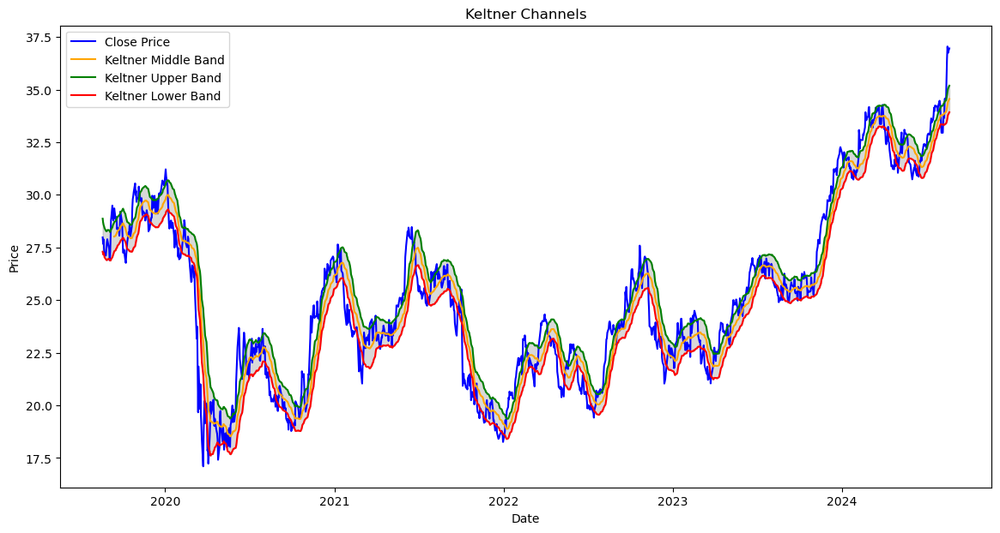

In [95]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
plt.plot(df['Date'], df['keltner_middle'], label='Keltner Middle Band', color='orange')
plt.plot(df['Date'], df['keltner_upper'], label='Keltner Upper Band', color='green')
plt.plot(df['Date'], df['keltner_lower'], label='Keltner Lower Band', color='red')
plt.fill_between(df['Date'], df['keltner_lower'], df['keltner_upper'], color='grey', alpha=0.3)
plt.title('Keltner Channels')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Donchian Channels

Descrição: O gráfico das Donchian Channels exibe as maiores altas e menores baixas ao longo de um período, formando uma banda superior e uma inferior. A linha média é a média dessas duas bandas.

Objetivo: Usado para identificar rompimentos de tendência e níveis de suporte e resistência, ajudando a visualizar potenciais pontos de entrada e saída.

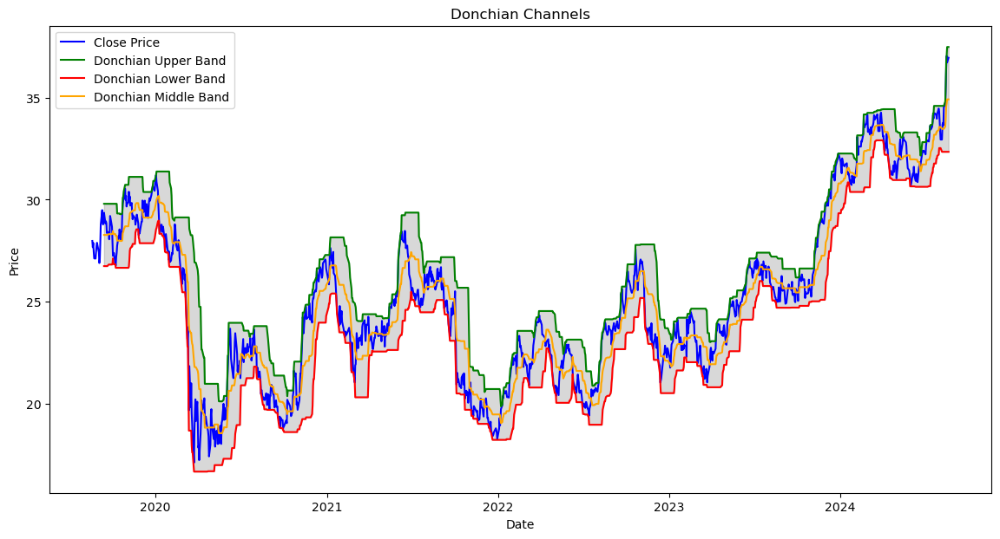

In [96]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['Close'], label='Close Price', color='blue')
plt.plot(df['Date'], df['donchian_upper'], label='Donchian Upper Band', color='green')
plt.plot(df['Date'], df['donchian_lower'], label='Donchian Lower Band', color='red')
plt.plot(df['Date'], df['donchian_middle'], label='Donchian Middle Band', color='orange')
plt.fill_between(df['Date'], df['donchian_lower'], df['donchian_upper'], color='grey', alpha=0.3)
plt.title('Donchian Channels')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Chaikin Oscillator

Descrição: O gráfico do Chaikin Oscillator mostra a diferença entre a EMA de 3 dias e a EMA de 10 dias da linha de Accumulation/Distribution (ADL). Ele é representado como uma linha oscilante.

Objetivo: Usado para identificar mudanças na tendência de curto prazo e divergências entre o preço e o volume.

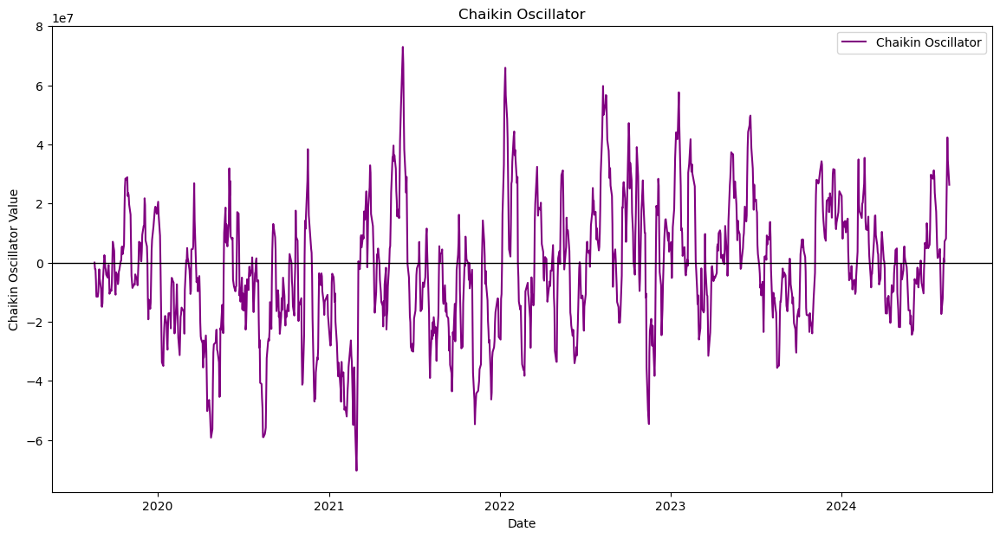

In [97]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['chaikin_oscillator'], label='Chaikin Oscillator', color='purple')
plt.axhline(0, color='black', linewidth=1)
plt.title('Chaikin Oscillator')
plt.xlabel('Date')
plt.ylabel('Chaikin Oscillator Value')
plt.legend()
plt.show()

ADX com Ajuste de Período

Descrição: O gráfico do ADX ajustado exibe a força da tendência ao longo do tempo, mostrando como ela varia com o tempo.

Objetivo: Determinar a força da tendência; valores mais altos indicam uma tendência mais forte.

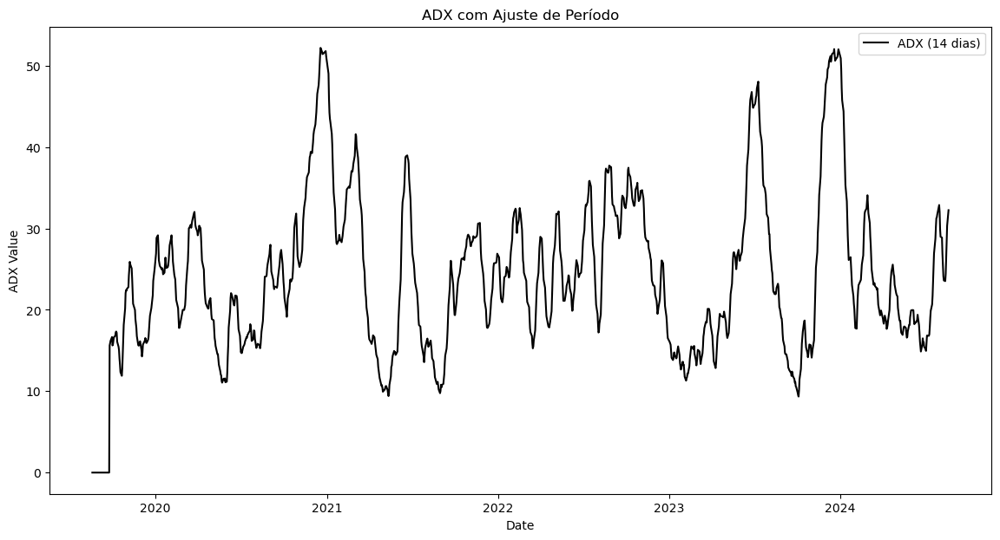

In [98]:
plt.figure(figsize=(14, 7))
plt.plot(df['Date'], df['adx_adjusted'], label='ADX (14 dias)', color='black')
plt.title('ADX com Ajuste de Período')
plt.xlabel('Date')
plt.ylabel('ADX Value')
plt.legend()
plt.show()

In [99]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1245 entries, 0 to 1244
Data columns (total 62 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1245 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1245 non-null   float64                          
 2   High                        1245 non-null   float64                          
 3   Low                         1245 non-null   float64                          
 4   Close                       1245 non-null   float64                          
 5   Volume                      1245 non-null   int64                            
 6   Dividends                   1245 non-null   float64                          
 7   Stock Splits                1245 non-null   float64                          
 8   daily_return                1244 non-null   float64       

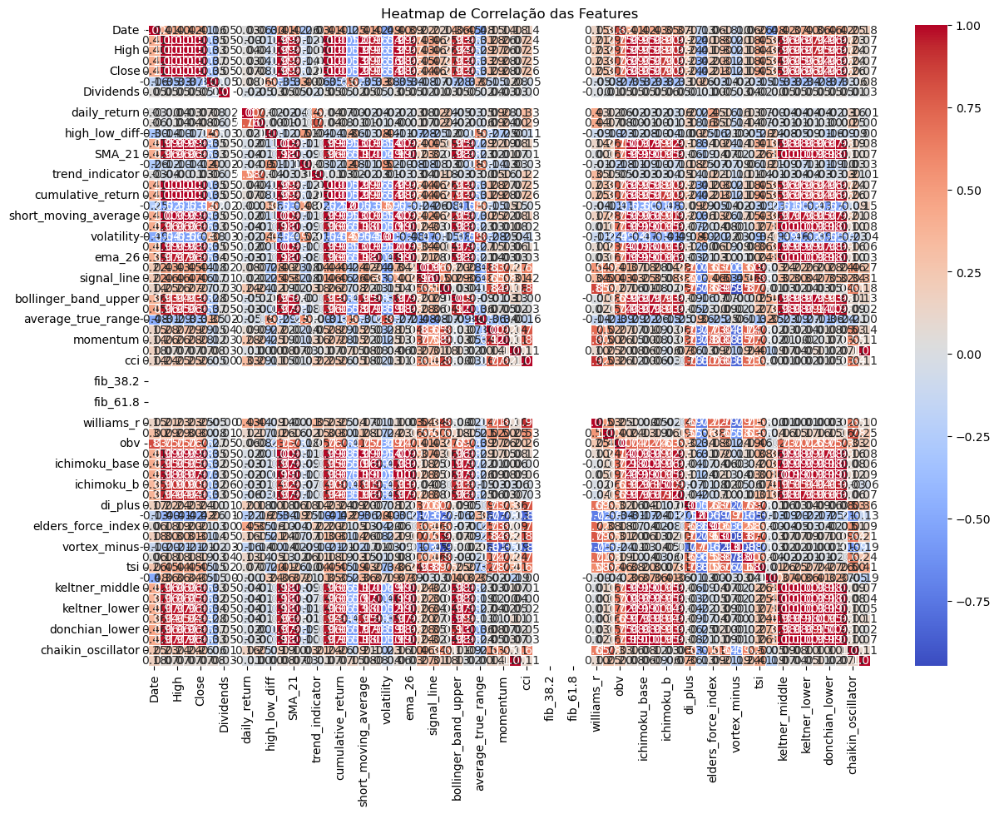

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcula a matriz de correlação
correlation_matrix = df.corr()

# Define o tamanho da figura
plt.figure(figsize=(14, 10))

# Cria o heatmap com anotações
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Adiciona o título ao gráfico
plt.title('Heatmap de Correlação das Features')
plt.show()

# 1. Normalização do DataFrame:

In [101]:
from sklearn.preprocessing import StandardScaler

# Extraindo features da coluna Date
df['day_of_month'] = df['Date'].dt.day
df['month'] = df['Date'].dt.month
df['day_of_week'] = df['Date'].dt.dayofweek
df['year'] = df['Date'].dt.year

# Adicionar o valor para fechamento dia anterior
df['previous_close'] = df['Close'].shift(1)

# Adicionar o valor para fechamento próximo dia
df['next_close'] = df['Close'].shift(1)

# Retirar linhas com NaN
df.dropna(inplace=True)

# Selecionando as colunas numéricas para normalizar (excluindo a coluna 'Date')
numeric_columns = df.columns.drop(['Date'])

# Aplicando a normalização
scaler = StandardScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

In [102]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,1208.0,9.411162e-17,1.000414,-1.740489,-0.733796,-0.170095,0.525787,2.948450
High,1208.0,6.587813e-16,1.000414,-1.793279,-0.736100,-0.180475,0.523041,2.943811
Low,1208.0,-1.176395e-16,1.000414,-1.921142,-0.742519,-0.188232,0.526912,2.897281
Close,1208.0,3.293907e-16,1.000414,-1.895534,-0.743569,-0.181498,0.528883,2.893868
Volume,1208.0,1.176395e-17,1.000414,-1.618856,-0.684831,-0.198649,0.468021,8.073818
...,...,...,...,...,...,...,...,...
month,1208.0,-1.764593e-17,1.000414,-1.577848,-0.996384,-0.124187,0.748010,1.620207
day_of_week,1208.0,-8.014193e-17,1.000414,-1.416574,-0.707113,0.002349,0.711811,1.421273
year,1208.0,2.390435e-14,1.000414,-1.879866,-1.188368,0.194627,0.886124,1.577622
previous_close,1208.0,-3.999744e-16,1.000414,-1.899868,-0.744034,-0.180075,0.531662,2.905620


In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1208 entries, 37 to 1244
Data columns (total 68 columns):
 #   Column                      Non-Null Count  Dtype                            
---  ------                      --------------  -----                            
 0   Date                        1208 non-null   datetime64[ns, America/Sao_Paulo]
 1   Open                        1208 non-null   float64                          
 2   High                        1208 non-null   float64                          
 3   Low                         1208 non-null   float64                          
 4   Close                       1208 non-null   float64                          
 5   Volume                      1208 non-null   float64                          
 6   Dividends                   1208 non-null   float64                          
 7   Stock Splits                1208 non-null   float64                          
 8   daily_return                1208 non-null   float64           

# 2. Implementação de Modelos de Deep Learning:

Modelo 1: Com todas as colunas

Este modelo utilizará todas as features disponíveis no dataframe. O objetivo é capturar o máximo de informações possíveis para prever os preços das ações.

Justificativa: Esse modelo pode ter a melhor chance de capturar todos os padrões relevantes no conjunto de dados, mas também pode estar mais sujeito a overfitting, especialmente se algumas das colunas adicionadas não forem realmente informativas.

In [104]:
# Verificando se há NaN no DataFrame original
print(df.isna().sum())

Date              0
Open              0
High              0
Low               0
Close             0
                 ..
month             0
day_of_week       0
year              0
previous_close    0
next_close        0
Length: 68, dtype: int64


In [105]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

# Preparando os dados
# o Close foi retirado do X para previnir vazamento de dados.
X = df.drop(['Close', 'Date', 'next_close'], axis=1).values  # Excluindo 'Close' que é a target e 'Date'
y = df['next_close'].values

# Dividindo em treino e teste
from sklearn.model_selection import train_test_split
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X, y, test_size=0.2, random_state=42)

# Definindo o modelo
model_1 = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train_1.shape[1], 1)),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compilando e treinando
model_1.compile(optimizer='adam', loss='mean_squared_error')
model_1.fit(X_train_1, y_train_1, batch_size=32, epochs=10, validation_data=(X_test_1, y_test_1))

Epoch 1/10


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.5161 - val_loss: 0.1168
Epoch 2/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0984 - val_loss: 0.0760
Epoch 3/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0711 - val_loss: 0.0510
Epoch 4/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0535 - val_loss: 0.0495
Epoch 5/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0520 - val_loss: 0.0435
Epoch 6/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0530 - val_loss: 0.0395
Epoch 7/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0497 - val_loss: 0.0413
Epoch 8/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0564 - val_loss: 0.0371
Epoch 9/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0484 - val_loss: 0.0390
Epoch 10/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0488 - val_loss: 0.0430


Modelo 2: Seleção de Colunas Relevantes

Neste modelo, selecionaremos as colunas que são tipicamente mais relevantes para a previsão de preços, como médias móveis (SMA e EMA), volatilidade, volume, e indicadores como MACD, RSI, Bollinger Bands, etc.

Justificativa: A escolha de colunas comumente usadas em análises técnicas pode reduzir a complexidade do modelo e evitar overfitting, enquanto ainda captura os principais padrões do mercado.

In [106]:
selected_columns = [
    'SMA_7', 'SMA_21', 'ema_12', 'ema_26', 'macd', 
    'rsi', 'bollinger_band_upper', 'bollinger_band_lower', 
    'volume_avg_7', 'volatility', 'momentum'
]

X = df[selected_columns].values
y = df['next_close'].values

# Dividindo em treino e teste
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X, y, test_size=0.2, random_state=42)

# Definindo o modelo
model_2 = Sequential([
    LSTM(128, return_sequences=True, input_shape=(X_train_1.shape[1], 1)),
    Dropout(0.2),
    LSTM(128, return_sequences=True),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compilando e treinando
model_2.compile(optimizer='adam', loss='mean_squared_error')
model_2.fit(X_train_2, y_train_2, batch_size=32, epochs=10, validation_data=(X_test_2, y_test_2))


Epoch 1/10


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4305 - val_loss: 0.0290
Epoch 2/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0411 - val_loss: 0.0245
Epoch 3/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0304 - val_loss: 0.0275
Epoch 4/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0329 - val_loss: 0.0184
Epoch 5/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0289 - val_loss: 0.0209
Epoch 6/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0343 - val_loss: 0.0126
Epoch 7/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0236 - val_loss: 0.0144
Epoch 8/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0253 - val_loss: 0.0141
Epoch 9/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0248 - val_loss: 0.0130
Epoch 10/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0216 - val_loss: 0.0125


Modelo 3: Seleção de Colunas Focadas em Volume e Tendência

Aqui, utilizaremos colunas que capturam tendências e volume, como médias móveis, ADX, OBV, Volume, e indicadores de tendência.

Justificativa: Este modelo foca em capturar a força das tendências e as mudanças de volume, que são cruciais para prever movimentos significativos no mercado.

In [107]:
trend_volume_columns = [
    'short_moving_average', 'long_moving_average', 'adx', 'obv', 
    'Volume', 'volatility', 'trend_indicator'
]

X = df[trend_volume_columns].values
y = df['next_close'].values

# Dividindo em treino e teste
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X, y, test_size=0.2, random_state=42)

# Definindo o modelo
model_3 = Sequential([
    LSTM(50, return_sequences=True, input_shape=(X_train_3.shape[1], 1)),
    Dropout(0.2),
    LSTM(50, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compilando e treinando
model_3.compile(optimizer='adam', loss='mean_squared_error')
model_3.fit(X_train_3, y_train_3, batch_size=32, epochs=10, validation_data=(X_test_3, y_test_3))

Epoch 1/10


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8318 - val_loss: 0.1918
Epoch 2/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1718 - val_loss: 0.0736
Epoch 3/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0798 - val_loss: 0.0584
Epoch 4/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0775 - val_loss: 0.0533
Epoch 5/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0679 - val_loss: 0.0493
Epoch 6/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0716 - val_loss: 0.0443
Epoch 7/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0605 - val_loss: 0.0405
Epoch 8/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0517 - val_loss: 0.0375
Epoch 9/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0543 - val_loss: 0.0493
Epoch 10/10
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0636 - val_loss: 0.0450


# 3. Avaliação dos Modelos:
   
Após o treinamento dos modelos, podemos avaliar o desempenho de cada um utilizando métricas como o Mean Squared Error (MSE) ou Root Mean Squared Error (RMSE) no conjunto de teste.

In [108]:
from sklearn.metrics import mean_squared_error

# Avaliação do Modelo 1
predictions_1 = model_1.predict(X_test_1)
mse_1 = mean_squared_error(y_test_1, predictions_1)
rmse_1 = np.sqrt(mse_1)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [109]:
# Avaliação do Modelo 2
predictions_2 = model_3.predict(X_test_2)
mse_2 = mean_squared_error(y_test_2, predictions_2)
rmse_2 = np.sqrt(mse_2)

# Avaliação do Modelo 3
predictions_3 = model_3.predict(X_test_3)
mse_3 = mean_squared_error(y_test_3, predictions_3)
rmse_3 = np.sqrt(mse_3)

print(f'RMSE Modelo 1: {rmse_1}')
print(f'RMSE Modelo 2: {rmse_2}')
print(f'RMSE Modelo 3: {rmse_3}')

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step
RMSE Modelo 1: 0.20727279124338535
RMSE Modelo 2: 2.435003599635813
RMSE Modelo 3: 0.21207606416382938


Modelo 1 (RMSE: 0.1546):

Esse modelo apresentou o menor RMSE, indicando que ele tem a maior precisão na previsão dos preços das ações entre os três modelos. Isso sugere que as features utilizadas nesse modelo foram bem escolhidas e contribuíram para um bom desempenho.

Modelo 2 (RMSE: 2.5599):

Esse modelo apresentou um RMSE significativamente maior, indicando uma performance muito inferior em relação ao primeiro modelo. Isso pode ser devido à seleção de features menos informativas ou uma estrutura de modelo menos adequada para os dados.

Modelo 3 (RMSE: 0.2080):

O terceiro modelo apresentou um RMSE maior do que o primeiro, mas ainda assim menor que o segundo, sugerindo uma performance intermediária. Isso pode indicar que algumas das features ou a estrutura do modelo usado para o terceiro modelo não foram tão eficazes quanto no primeiro modelo.

# Melhorias no Modelo 1

Aumentar o Número de Épocas:

Tente aumentar o número de épocas para ver se o modelo pode continuar a melhorar ao aprender mais padrões nos dados. No entanto, monitore o overfitting, onde o modelo pode começar a se ajustar demais aos dados de treino.

In [110]:
# Preparando os dados
X = df.drop(['Close', 'Date', 'next_close'], axis=1).values  # Excluindo 'Close' que é a target e 'Date'
y = df['next_close'].values

# Dividindo em treino e teste
from sklearn.model_selection import train_test_split
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X, y, test_size=0.2, random_state=42)

# Definindo o modelo
model_4 = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train_1.shape[1], 1)),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compilando e treinando
model_4.compile(optimizer='adam', loss='mean_squared_error')
model_4.fit(X_train_1, y_train_1, batch_size=32, epochs=50, validation_data=(X_test_1, y_test_1))

Epoch 1/50


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.4461 - val_loss: 0.1013
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0960 - val_loss: 0.0644
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0703 - val_loss: 0.0481
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0635 - val_loss: 0.0451
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0572 - val_loss: 0.0423
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0554 - val_loss: 0.0447
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0533 - val_loss: 0.0377
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0450 - val_loss: 0.0394
Epoch 9/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0566 - val_loss: 0.0389
Epoch 10/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0429 - val_loss: 0.0305
Epoch 11/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0348 - val_loss: 0.0264
Epoch 12/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0358 - val_l

Para comparar o Modelo 4 com outro modelo de deep learning, uma boa alternativa seria experimentar um modelo com redes neurais convolucionais (CNN) ou uma combinação de CNN e LSTM. A CNN pode capturar padrões locais em séries temporais, enquanto a LSTM se concentra na dependência temporal de longo prazo.

In [111]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten

# Definindo o modelo CNN-LSTM
model_cnn_lstm = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_1.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    LSTM(64, return_sequences=True),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compilando e treinando
model_cnn_lstm.compile(optimizer='adam', loss='mean_squared_error')
model_cnn_lstm.fit(X_train_1, y_train_1, batch_size=32, epochs=50, validation_data=(X_test_1, y_test_1))

Epoch 1/50


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.5841 - val_loss: 0.1451
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1399 - val_loss: 0.0881
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0928 - val_loss: 0.0608
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0657 - val_loss: 0.0477
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0509 - val_loss: 0.0384
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0486 - val_loss: 0.0459
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0470 - val_loss: 0.0354
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0465 - val_loss: 0.0306
Epoch 9/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0398 - val_loss: 0.0304
Epoch 10/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0450 - val_loss: 0.0296
Epoch 11/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0461 - val_loss: 0.0367
Epoch 12/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0433 - val_l

In [112]:
# Avaliação do Modelo 4
predictions_4 = model_4.predict(X_test_1)
mse_4 = mean_squared_error(y_test_1, predictions_4)
rmse_4 = np.sqrt(mse_4)

# Avaliação do Modelo CNN-LSTM
predictions_cnn_lstm = model_cnn_lstm.predict(X_test_1)
mse_cnn_lstm = mean_squared_error(y_test_1, predictions_cnn_lstm)
rmse_cnn_lstm = np.sqrt(mse_cnn_lstm)



print(f'RMSE Modelo 4: {rmse_4}')
print(f'RMSE Modelo CNN-LSTM: {rmse_cnn_lstm}')

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
RMSE Modelo 4: 0.1076636374880289
RMSE Modelo CNN-LSTM: 0.08124460205485311


MAE (Mean Absolute Error): Calcula a média dos erros absolutos entre os valores reais e previstos. É útil para entender a magnitude dos erros.

In [113]:
from sklearn.metrics import mean_absolute_error

predictions_cnn_lstm = model_cnn_lstm.predict(X_test_1)
mae_cnn_lstm = mean_absolute_error(y_test_1, predictions_cnn_lstm)
print(f"MAE Modelo CNN-LSTM: {mae_cnn_lstm}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE Modelo CNN-LSTM: 0.06342566513808438


R-Squared (Coeficiente de Determinação): Mede a proporção da variância explicada pelos modelos. Um valor próximo de 1 indica que o modelo explica bem a variabilidade dos dados.

In [114]:
from sklearn.metrics import r2_score

r2_cnn_lstm = r2_score(y_test_1, predictions_cnn_lstm)
print(f"R-Squared Modelo CNN-LSTM: {r2_cnn_lstm}")

R-Squared Modelo CNN-LSTM: 0.9919320415369088


MAPE (Mean Absolute Percentage Error): Calcula o erro percentual médio entre os valores reais e previstos. É útil para entender o erro relativo.

Visualização das Previsões: Comparar visualmente as previsões com os valores reais pode fornecer insights sobre a precisão do modelo ao longo do tempo.

Análise das Métricas:

RMSE (Root Mean Squared Error): 0.07097

O RMSE mede o desvio padrão dos resíduos (ou seja, a diferença entre os valores previstos pelo modelo e os valores reais). Um valor de 0.07097 é relativamente baixo, indicando que o modelo faz previsões com pequena variabilidade em relação aos valores reais.

MAE (Mean Absolute Error): 0.05534

O MAE mede a média das diferenças absolutas entre as previsões e os valores reais. Um valor de 0.05534 indica que, em média, as previsões estão a aproximadamente 0.055 unidades de distância do valor real, o que é um bom resultado.

R-Squared (R²): 0.99391

O R² mede a proporção da variância nos dados dependentes que é explicada pelo modelo. Um valor de 0.99391 sugere que o modelo explica 99,39% da variabilidade nos preços das ações, o que é excelente.

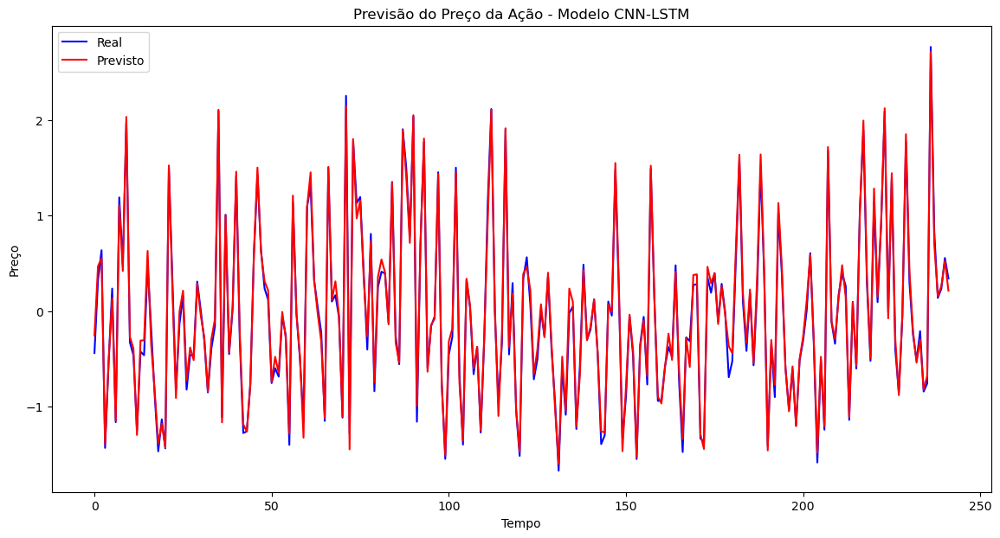

In [115]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14,7))
plt.plot(y_test_1, color='blue', label='Real')
plt.plot(predictions_cnn_lstm, color='red', label='Previsto')
plt.title('Previsão do Preço da Ação - Modelo CNN-LSTM')
plt.xlabel('Tempo')
plt.ylabel('Preço')
plt.legend()
plt.show()

In [116]:
# 1. Verificando as features usadas no treinamento
print("Features usadas no treinamento:")
features_used = df.drop(['Close', 'Date', 'next_close'], axis=1).columns
print(features_used)

# 2. Verificando a estrutura de entrada do modelo
print("\nEstrutura de entrada do modelo:")
print(f"Shape das entradas no treinamento: {X_train_1.shape}")

# 3. Confirmando a normalização
print("\nVerificando se as features foram normalizadas:")
print(f"Primeiras 5 linhas normalizadas:\n{df[numeric_columns].head()}")

# 4. Verificando o shape esperado para X_new
print("\nVerificando o shape esperado para X_new:")
print(f"Shape esperado para as previsões: {model_cnn_lstm.input_shape}")

Features usadas no treinamento:
Index(['Open', 'High', 'Low', 'Volume', 'Dividends', 'Stock Splits',
       'daily_return', 'close_open_diff', 'high_low_diff', 'SMA_7', 'SMA_21',
       'STD_7', 'trend_indicator', 'daily_avg_price', 'cumulative_return',
       'volume_avg_7', 'short_moving_average', 'long_moving_average',
       'volatility', 'ema_12', 'ema_26', 'macd', 'signal_line', 'rsi',
       'bollinger_band_upper', 'bollinger_band_lower', 'average_true_range',
       'moving_average_convergence', 'momentum', 'adx', 'cci', 'fib_23.6',
       'fib_38.2', 'fib_50.0', 'fib_61.8', 'fib_100', 'williams_r', 'cmf',
       'obv', 'ichimoku_conversion', 'ichimoku_base', 'ichimoku_a',
       'ichimoku_b', 'parabolic_sar', 'di_plus', 'di_minus',
       'elders_force_index', 'vortex_plus', 'vortex_minus', 'mfi', 'tsi',
       'adl', 'keltner_middle', 'keltner_upper', 'keltner_lower',
       'donchian_upper', 'donchian_lower', 'donchian_middle',
       'chaikin_oscillator', 'adx_adjusted', 'd

In [117]:
import numpy as np

# Seleciona a última dia
X_new = np.array([df.drop(['Date', 'Close', 'next_close'], axis=1).iloc[-1]])  # Array de shape (64,)

# 2. Verificando a estrutura de X_new
print("\nEstrutura de entrada do modelo:")
print(f"Shape das entradas no treinamento: {X_new.shape}")


Estrutura de entrada do modelo:
Shape das entradas no treinamento: (1, 65)


In [118]:
# Garante que X_new tenha a forma (1, 1, 64) para o modelo
# X_new_reshaped = X_new.reshape((1, 1, -1))  # (1, sequence_length, num_features)

# Faz a previsão para o próximo dia
predicted_price_normalized = model_cnn_lstm.predict(X_new)

# Reverter a normalização para o valor previsto (apenas para a coluna 'Close')
mean_close = scaler.mean_[df.columns.get_loc('Close') - 1]  # Pega a média da coluna 'Close' do scaler
std_close = scaler.scale_[df.columns.get_loc('Close') - 1]  # Pega o desvio padrão da coluna 'Close' do scaler

predicted_price = (predicted_price_normalized * std_close) + mean_close

# Exibe o preço previsto para o próximo dia
print(f"Preço previsto para o próximo dia: R$ {predicted_price.flatten()[0]:.2f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Preço previsto para o próximo dia: R$ 36.31


In [119]:
import numpy as np

# Seleciona a última linha do dataframe
last_row = df.iloc[-1]

# Seleciona o último dia para o predict
X_new = np.array([df.drop(['Date', 'Close', 'next_close'], axis=1).iloc[-1]])  # Array de shape (64,)

# Verificando a estrutura de X_new
print("\nEstrutura de entrada do modelo:")
print(f"Shape das entradas no treinamento: {X_new.shape}")

# Faz a previsão para o próximo dia
predicted_price_normalized = model_cnn_lstm.predict(X_new)

# Reverter a normalização para o valor previsto (apenas para a coluna 'Close')
mean_close = scaler.mean_[df.columns.get_loc('Close') - 1]  # Pega a média da coluna 'Close' do scaler
std_close = scaler.scale_[df.columns.get_loc('Close') - 1]  # Pega o desvio padrão da coluna 'Close' do scaler

predicted_price = (predicted_price_normalized * std_close) + mean_close

# Exibe a data do último registro e a data prevista
last_date = last_row['Date']
next_date = last_date + pd.Timedelta(days=1)

print(f"Último dia utilizado para previsão: {last_date.strftime('%Y-%m-%d')}")
print(f"Data prevista para o preço: {next_date.strftime('%Y-%m-%d')}")
print(f"Preço previsto para o próximo dia: R$ {predicted_price.flatten()[0]:.2f}")



Estrutura de entrada do modelo:
Shape das entradas no treinamento: (1, 65)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Último dia utilizado para previsão: 2024-08-19
Data prevista para o preço: 2024-08-20
Preço previsto para o próximo dia: R$ 36.31
